# Processing chain: QPE using XPol and DWD radar data.

Daniel Sanchez-Rivas<sup>1</sup>

<sup>1</sup>Department of Meteorology, University of Bonn, Bonn, Germany

This notebook outlines the process of retrieving, quality-checking, processing, and generating QPE (whether single-site or composite) using raw data from two research X-band radars (Boxpol and JuXPol) and four C-band radars part of the operational DWD (Deutscher Wetterdienst) radar network.

If you find  this notebook helpful, consider citing the [Towerpy paper](https://www.sciencedirect.com/science/article/pii/S1364815223001329):

> @article{sanchezrivas2023, title = {{Towerpy: An open-source toolbox for processing polarimetric weather radar data}}, journal = {Environmental Modelling & Software}, pages= {105746}, year = {2023}, issn = {1364-8152}, doi = {https://doi.org/10.1016/j.envsoft.2023.105746 }, author = {Daniel Sanchez-Rivas and Miguel Angel Rico-Ramirez}, keywords = {Weather radar, Polarimetry, Radar QPE, Radar research applications, Open source}}

I have the python script (*.py) version of this notebook available in this same directory [/radar/qpe/rcomp_xpoldwd_mosaic.py].

For a more detailed description of the processing chain, see:
- [`Processing chain: DWD radar data (Precipitation scans)`](http://localhost:8888/lab/tree/radproc/radchain_dwd.ipynb)


## Read-in and quality control

### Import relevant packages

In [2]:
import os
import copy
from time import perf_counter
import datetime as dt
import pickle
import numpy as np
import towerpy as tp
from towerpy.datavis import rad_display
import wradlib as wrl
from wradlib.dp import phidp_kdp_vulpiani as kdpvpi
import cartopy.crs as ccrs
LWDIR = '/home/dsanchez/sciebo_dsr/'
sys.path.append(LWDIR + 'codes/github/unibonnpd/')
from radar import twpext as tpx
from radar.rparams_dwdxpol import RPARAMS

/home/dsanchez/mambaforge/envs/towerpy/lib/python3.10/site-packages/pyproj/network.py:59: UserWarning: pyproj unable to set PROJ database path.
  _set_context_ca_bundle_path(ca_bundle_path)



You are using the Towerpy framework, an open source library for
working with polarimetric weather radar data.

If you find our work useful for your research, please consider citing our
following publication:

https://doi.org/10.1016/j.envsoft.105746.2023



### Define working directories, date, time, radar sites and scan elevation to be used in the QPE

`MFS_DIR` and `CLM_DIR` are the directories where the membership functions and clutter maps used to process the X-band data are stored. These MFS and CM will be used in the non-meteorological echoes ID and were derived from BoXPol and JuXPol data.

In [3]:
START_TIME = dt.datetime(2021, 7, 14, 17, 45)

STOP_TIME = START_TIME+dt.timedelta(minutes=5)

MFS_DIR = (LWDIR + 'codes/github/unibonnpd/radar/nme/xpol_mfs/')
CLM_DIR = (LWDIR + 'codes/github/unibonnpd/radar/nme/xpol_clm/')

In this example, the radar QPE and composite data will be derived from six different radars. The `RPARAMS` variable is a dictionary that contains shared information related to calibration, QPE relations, and other parameters.

In [8]:
print(f"X-band radar sites: {[rs['site_name'] for rs in RPARAMS if rs['rband'] == 'X']}")
print(f"C-band radar sites: {[rs['site_name'] for rs in RPARAMS if rs['rband'] == 'C']}")

X-band radar sites: ['Boxpol', 'Juxpol', 'Aaxpol']
C-band radar sites: ['ASR Borkum', 'Boostedt', 'Dresden', 'Eisberg', 'Essen', 'Feldberg', 'Flechtdorf', 'Hannover', 'Isen', 'Memmingen', 'Neuhaus', 'Neuheilenbach', 'Offenthal', 'Protzel', 'Rostock', 'Turkheim', 'Ummendorf']


In [5]:
RSITES = ['Boxpol', 'Juxpol', 'Essen', 'Flechtdorf', 'Neuheilenbach',
          'Offenthal']

RPARAMS = {rs['site_name']: rs for rs in RPARAMS if rs['site_name'] in RSITES}

RSITE_FILES = {i['site_name']:
               tpx.get_listfilesxpol(i['site_name'], START_TIME, STOP_TIME,
                                     i['elev'])[0]
               if 'xpol' in i['site_name'].lower() else
               tpx.get_listfilesdwd(i['site_name'], START_TIME, STOP_TIME,
                                    i['elev'])
               for k, i in RPARAMS.items()}

Set `Composite` to true to generate the radar mosaic.

In [6]:
COMPOSITE = True

### Set plotting parameters

In [7]:
PLOT_METHODS = False

# xlims, ylims = [4.44, 16.08], [55.53, 46.52]  # DWD COMPLETE RADCOV
# xlims, ylims = [5.85, 15.04], [55.05, 47.27]  # DWD RADCOV_Germany
# xlims, ylims = [4.324, 10.953], [48.635, 52.754]  # DWDXPOL COMPLETE RADCOV
xlims, ylims = [5.85, 11.], [48.55, 52.75]  # DWDXPOL RADCOV_GERMANY
fig_size = (10.5, 7)

### Read-in QVPs data

I derive the melting layer height, offsets and additional parameters from quasi-vertical profiles. I organise this information into distinct files for easier access and analysis. 
For a detailed description of the QVPs processing, see the notebook: `Processing chain: QVPs using XPol or DWD radar data.` [[/radar/qvps/radchain_profs_build]](http://localhost:8888/lab/tree/qvps/radchain_profs_build.ipynb)

**IF THE QVPS INFORMATION IS NOT AVAILABLE, DEFAULT VALUES FOR THE MELTING LAYER HEIGHT, OFFSETS AND OTHER PARAMETERS WILL BE READ FROM THE `RPARAMS` DICT.**

The following lines can be used to modify the default parameters, such as the MLH. Uncomment and modify them as required.

In [8]:
# for rk1, rp1 in RPARAMS.items():
#    rp1['mlt'] = 2.95

The `max_diffdtmin` parameter sets the maximum allowable difference (in minutes) between the radar scan and the nearest available data **(in the past)** from the QVPS. In this example, it is set to 2 hours (or 120 minutes). I also compute the daily average of the parameters derived from QVPS. This means that the melting layer height (MLH) is validated by checking the available QVP data, and it is considered valid if the closest data falls within this time window; if not, the daily mean of the ML height is used instead.

In [9]:
max_diffdtmin = 120

In [10]:
data4calib = 'qvps'
appx = ''  # _extmlyr
PROFSDATA = LWDIR + (f"pd_rdres/qvps_d4calib{appx}/"
                     + f"{START_TIME.strftime('%Y%m%d')}/")

if not os.path.exists(PROFSDATA):
    PROFSDATA = None

RCAL_FILES = {k1: [PROFSDATA+n for n in sorted(os.listdir(PROFSDATA))
              if data4calib in n and k1 in n] for k1, rs in RPARAMS.items()}

profs_data = {}
for k1, rs in RCAL_FILES.items():
    if rs:
        with open(rs[0], 'rb') as breader:
            profs_data[k1] = pickle.load(breader)
    else:
        profs_data[k1] = {}

mlt_avg = {k1: np.nanmean([i.ml_top for i in profs_data[k1]['mlyr']])
           if v1 else np.nan for k1, v1 in profs_data.items()}
mlk_avg = {k1: np.nanmean([i.ml_thickness for i in profs_data[k1]['mlyr']])
           if v1 else np.nan for k1, v1 in profs_data.items()}

mlyrhv = {k1: [i for i in v1['mlyr'] if ~np.isnan(i.ml_top)]
          if v1 else [] for k1, v1 in profs_data.items()}
mlyrhv = {k1: (v1 if v1 else [profs_data[k1]['mlyr'][0]])
          if v1 else [] for k1, v1 in mlyrhv.items()}
phidpOv = {k1: [i for i in v1['phidpO'] if ~np.isnan(i.phidp_offset)]
           if v1 else [] for k1, v1 in profs_data.items()}
zdrOv = {k1: [i for i in v1['zdrO'] if ~np.isnan(i.zdr_offset)]
         if v1 else [] for k1, v1 in profs_data.items()}

### Import data into towerpy using wradlib

The Rad_scan class initialises a radar object.

The `ppi_dwd` and `ppi_xpol` functions provide an interface to read the XPol and DWD radar data based on wradlib.

©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain


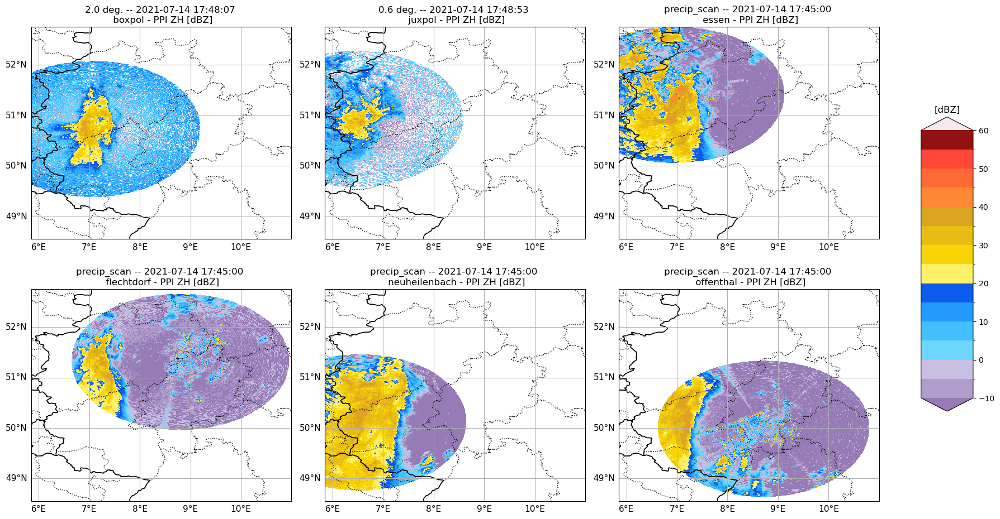

In [11]:
tic = perf_counter()
rdata = {k1: tpx.Rad_scan(RSITE_FILES[k1], k1)
         for k1, robj in RPARAMS.items() if RSITE_FILES[k1]}

[robj.ppi_xpol() if robj.site_name.lower() == 'boxpol' else
 robj.ppi_xpol(scan_elev=RPARAMS[k1]['elev'])
 if robj.site_name.lower() == 'juxpol'
 else robj.ppi_dwd() for k1, robj in rdata.items()]

rbands = {k1: RPARAMS[k1]['rband'] for k1, robj in rdata.items()}

tp.datavis.rad_display.plot_mgrid(
    [i.georef for k, i in rdata.items()],
    [i.params for k, i in rdata.items()],
    [i.vars for k, i in rdata.items()],  # ncols=3, nrows=2,
    cpy_feats={'status': True}, proj_suffix='utm',
    data_proj=ccrs.UTM(zone=32), xlims=xlims, ylims=ylims, fig_size=(18, 10))

### Allocate closest dataset from QVPs (for ML, offsets, etc)

In [12]:
idx_mlh = {k1: (min(zip(range(
    len([i.scandatetime for i in mlyrhv[k1]])),
    [i.scandatetime for i in mlyrhv[k1]]),
    key=lambda x: (x[1] > robj.scandatetime, abs(x[1] - robj.scandatetime)))
    if mlyrhv[k1] else (0, profs_data[k1]['mlyr'][0].scandatetime))
    if mlyrhv[k1] else () for k1, robj in rdata.items()}
idx_phidp0 = {k1: min(zip(range(
    len([i.scandatetime for i in phidpOv[k1]])),
        [i.scandatetime for i in phidpOv[k1]]),
    key=lambda x: (x[1] > robj.scandatetime, abs(x[1] - robj.scandatetime)))
    if phidpOv[k1] else ()
    for k1, robj in rdata.items()}
idx_zdr0 = {k1: min(zip(range(
    len([i.scandatetime for i in zdrOv[k1]])),
        [i.scandatetime for i in zdrOv[k1]]),
    key=lambda x: (x[1] > robj.scandatetime, abs(x[1] - robj.scandatetime)))
    if zdrOv[k1] else ()
    for k1, robj in rdata.items()}
idx_pclass = {k1: min(zip(range(
    len(profs_data[k1]['dtrs'])), profs_data[k1]['dtrs']),
    key=lambda x: (x[1] > robj.scandatetime, abs(x[1] - robj.scandatetime)))
    if profs_data[k1] else ()
    for k1, robj in rdata.items()}

### Radar reflectivity $(Z_H)$ offset correction

If the $Z_H$ offset is known, it can be adjusted at this stage. If not, it can be estimated in later steps using polarimetric-based techniques.

In [13]:
for k1, v1 in RPARAMS.items():
    if 'xpol' in k1:
        # v1['zhO'] = v1['zh_offset'].get(START_TIME.strftime("%Y%m%d"))
        v1['zhO'] = 0
    else:
        v1['zhO'] = 0

for k1, robj in rdata.items():
    robj.zh_offset = RPARAMS[k1]['zhO']
    robj.vars['ZH [dBZ]'] += robj.zh_offset
    print(f'{robj.site_name}_ZH_O [{robj.zh_offset :.2f} dBZ]')

Boxpol_ZH_O [0.00 dBZ]
Juxpol_ZH_O [0.00 dBZ]
Essen_ZH_O [0.00 dBZ]
Flechtdorf_ZH_O [0.00 dBZ]
Neuheilenbach_ZH_O [0.00 dBZ]
Offenthal_ZH_O [0.00 dBZ]


### Correlation coefficient $(\rho_{HV})$ noise-correction

The process involves adjusting the radar constant (C) until a consistent relationship between the Signal-to-Noise Ratio (SNR) and the $\rho_{HV}$ is established, as outlined in **Ryzhkov and Zrnic (2019)**. For my particular implementation, a theoretical distribution of $\rho_{HV}$ is utilised to identify the "flat" dependency.

Also, the `noise_lvl` parameter defines the limits for searching the optimal noise level. This parameter was derived empirically and observed to change over time. As a result, different noise levels are stored in the RPARAMS dictionary.

Boxpol_Noise_Level [24.00 dB]
Juxpol_Noise_Level [32.70 dB]
Essen_Noise_Level [40.10 dB]
Flechtdorf_Noise_Level [40.10 dB]
Neuheilenbach_Noise_Level [39.40 dB]
Offenthal_Noise_Level [40.10 dB]


[None, None, None, None, None, None]

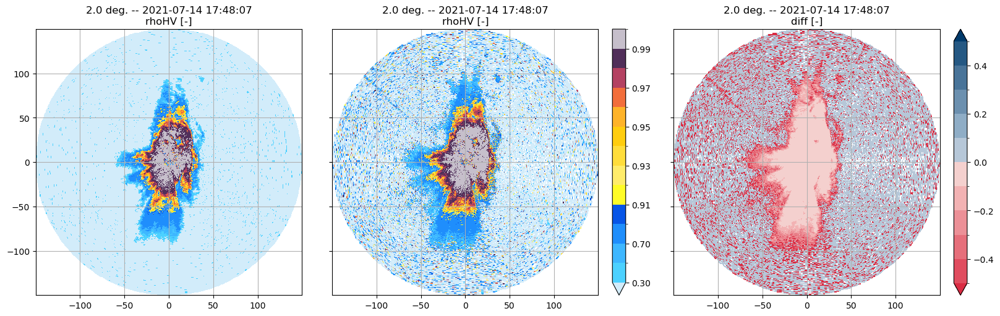

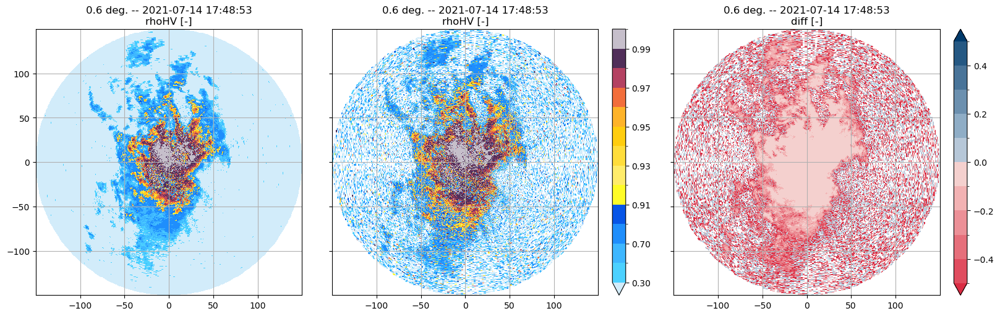

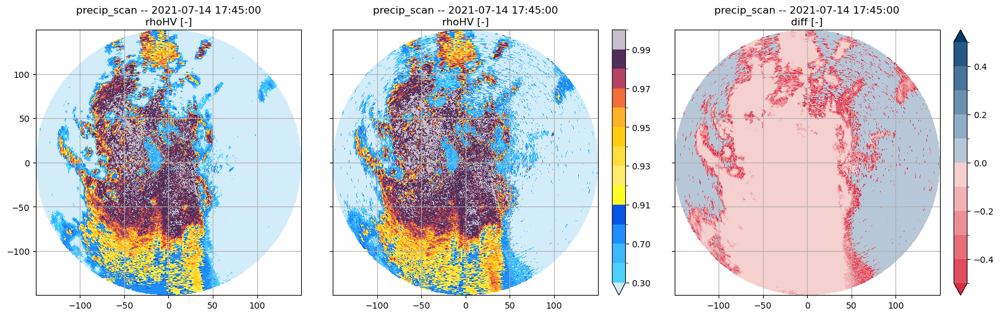

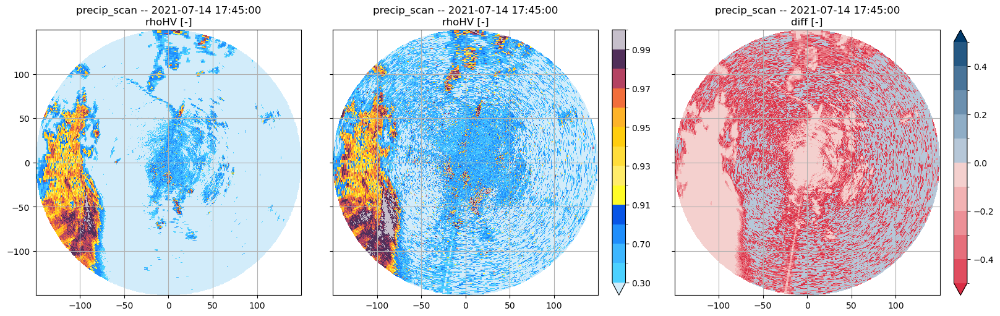

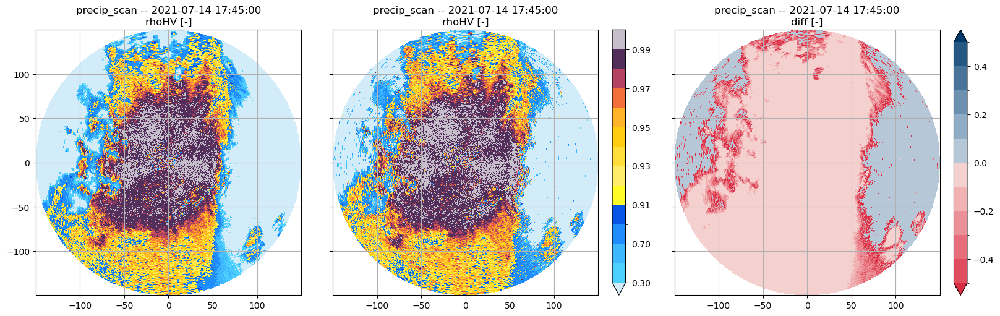

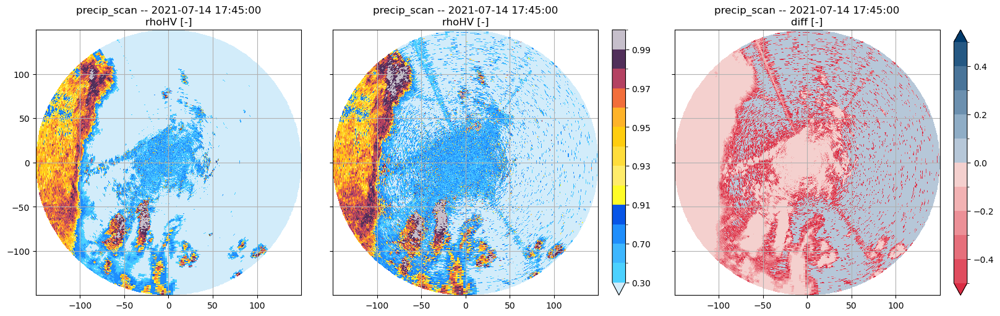

In [14]:
rcrho = {k1: tpx.rhoHV_Noise_Bias(robj) for k1, robj in rdata.items()}
[robj.iterate_radcst(
    rdata[k1].georef, rdata[k1].params, rdata[k1].vars,
    rhohv_theo=RPARAMS[k1]['rhvtc'], noise_lvl=RPARAMS[k1]['nlvl'],
    data2correct=rdata[k1].vars, plot_method=PLOT_METHODS)
 for k1, robj in rcrho.items()]

for k1, robj in rcrho.items():
    print(f"{robj.site_name}_Noise_Level"
          + f" [{robj.rhohv_corrs['Noise level [dB]'] :.2f} dB]")

[tp.datavis.rad_display.plot_ppidiff(
    robj.georef, robj.params, robj.vars, rcrho[k1].vars,
    var2plot1='rhoHV [-]', var2plot2='rhoHV [-]',
    ucmap_diff='tpylsc_div_dbu_rd', diff_lims=[-0.5, 0.5, .1])
 for k1, robj in rdata.items()]

### Noise suppression

I use the `signalnoiseratio` function to compute the Signal-to-Noise Ratio (SNR) in decibels (dB), which helps me quantify the level of desired signal compared to the background noise and get rid of noisy data. I use the reference noise value calculated in the $\rho_{HV}$ noise correction. By combining these two methods, I ensure that the noise level is accurately determined.

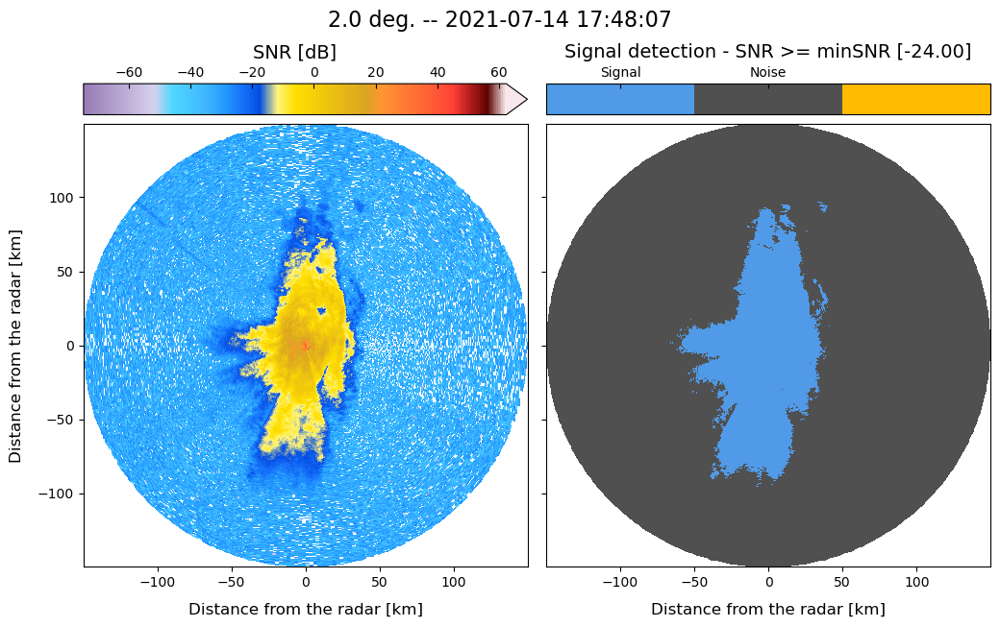

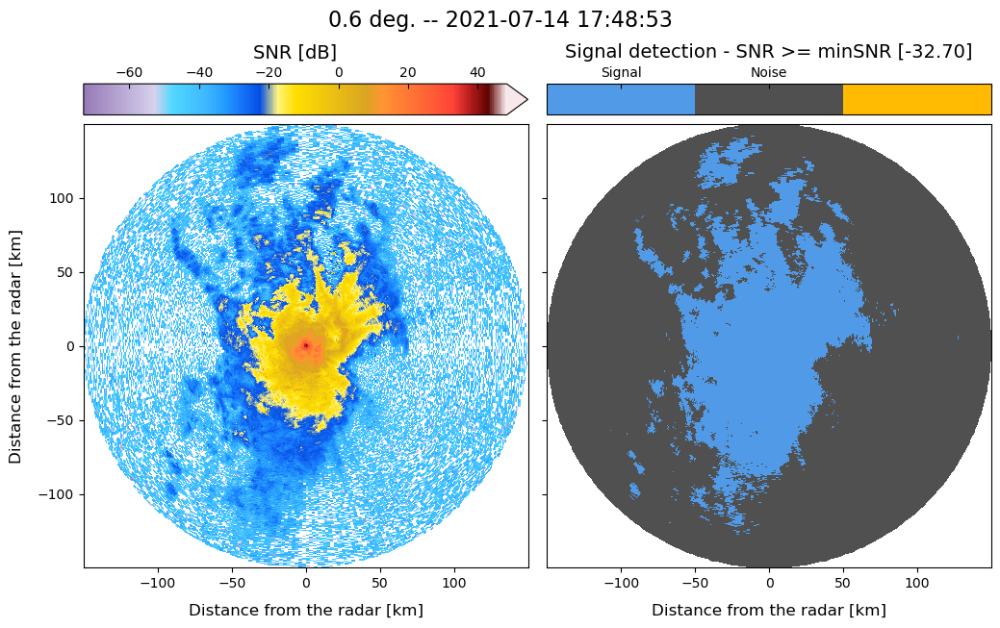

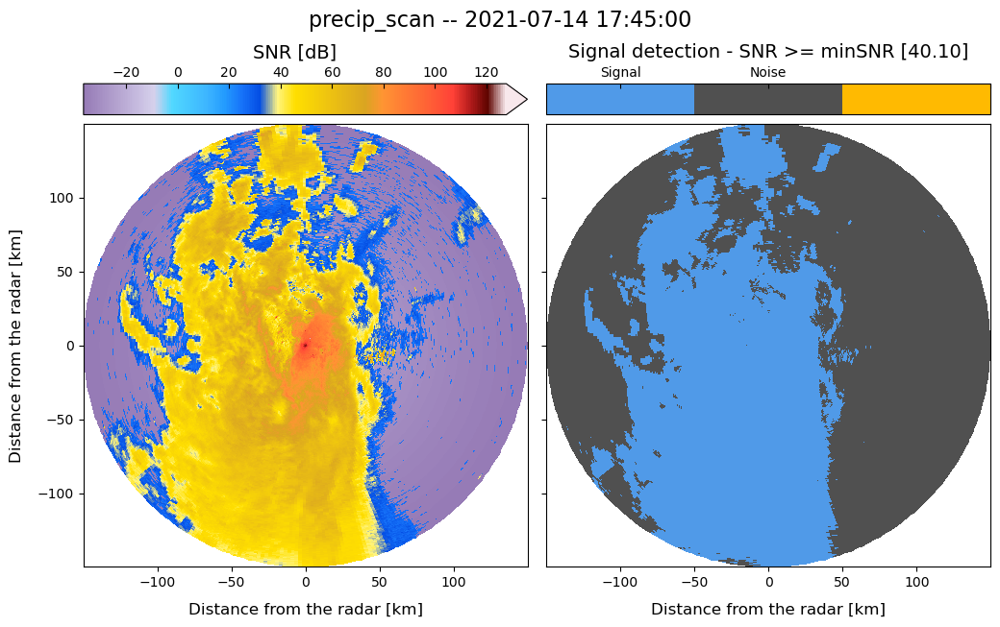

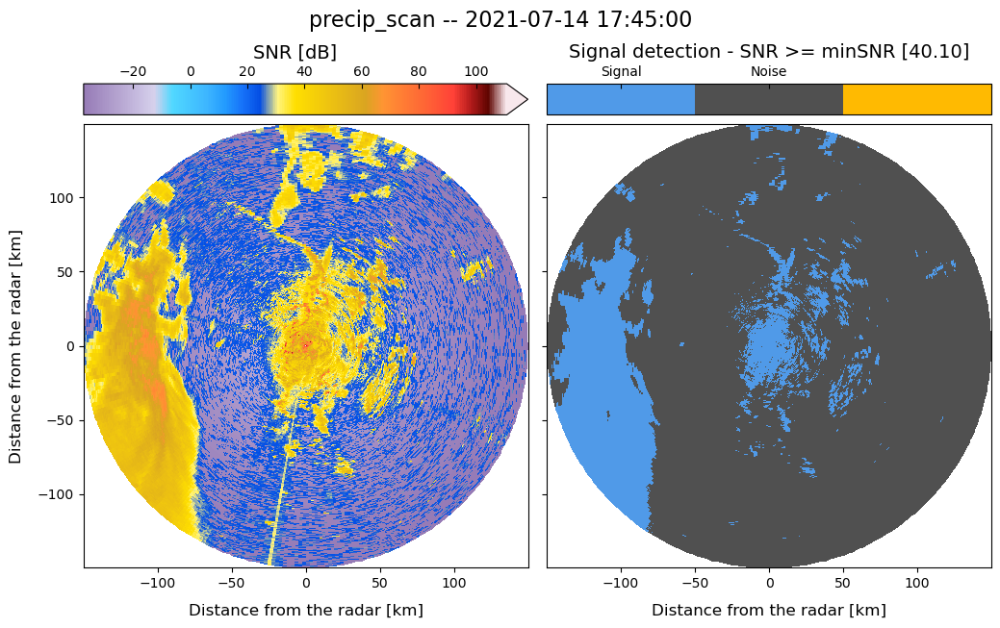

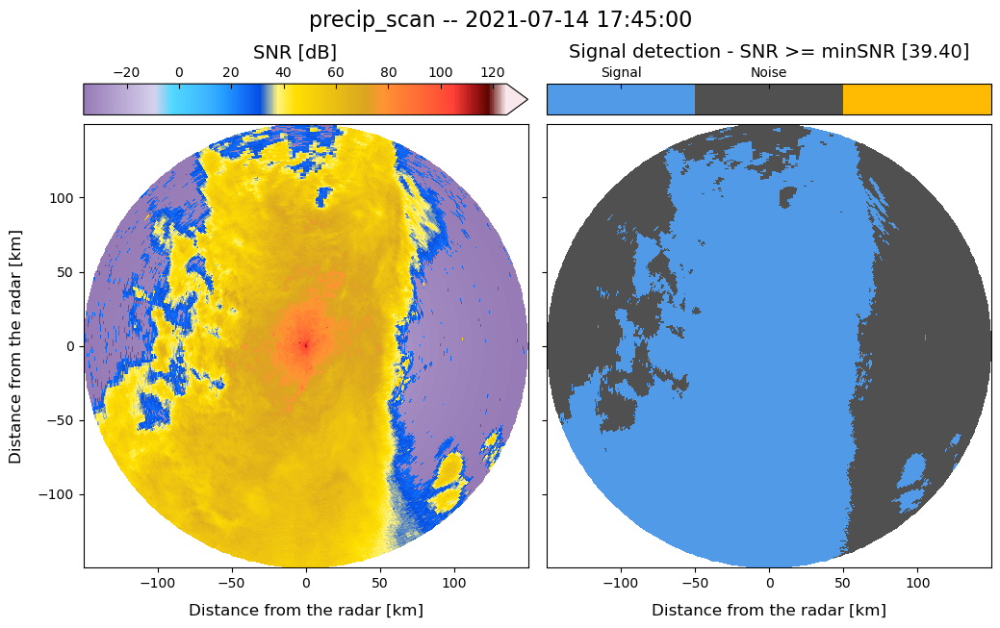

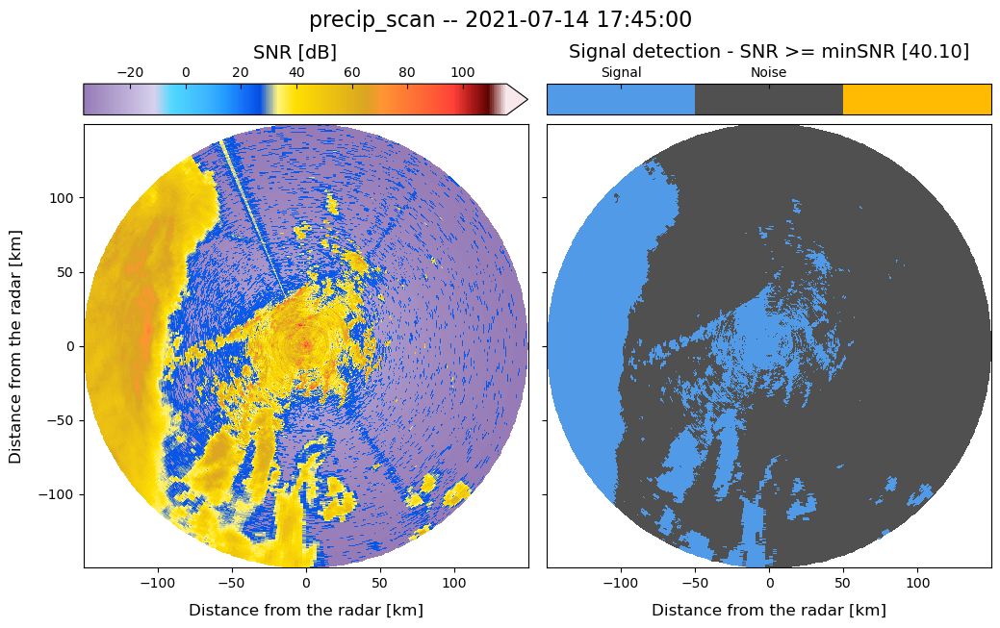

[None, None, None, None, None, None]

In [15]:
min_snr = {k1: (-robj.rhohv_corrs['Noise level [dB]']
           if rdata[k1].params['radar constant [dB]'] <= 0
           else robj.rhohv_corrs['Noise level [dB]'])
           for k1, robj in rcrho.items()}
rsnr = {k1: tp.eclass.snr.SNR_Classif(robj) for k1, robj in rcrho.items()}
[robj.signalnoiseratio(rdata[k1].georef, rdata[k1].params, rcrho[k1].vars,
                       min_snr=min_snr[k1], data2correct=rcrho[k1].vars,
                       plot_method=True)
 for k1, robj in rsnr.items()]

### Differential phase $(\Phi_{DP})$ quality control and processing

In this step, I aim to address two issues that may affect $\Phi_{DP}$:

(1) $\Phi_{DP}(0)$ : The `offsetdetection_ppi` function detects the value of $\Phi_{DP}(0)$, i.e. the $\Phi_{DP}$ offset. I empirically determined a range of predefined values for each radar site to identify $\Phi_{DP}(0)$. These preset values are used in the function to search for the offset within a specified tolerance (5 degrees). It is important to note that the offset can fluctuate over time due to various factors, including adjustments in radar configuration, hardware calibration or even environmental conditions. By monitoring these changes, I can ensure that the offset remains within an appropriate range, thereby enhancing the reliability of the final radar products.

(2) $\Phi_{DP}$ folding. I use the `unfold_phi` function from wradlib to unfold the differential phase.

Boxpol_PhiDP_O [85.74 deg]
Juxpol_PhiDP_O [119.06 deg]
Essen_PhiDP_O [35.78 deg]
Flechtdorf_PhiDP_O [-92.99 deg]
Neuheilenbach_PhiDP_O [8.22 deg]
Offenthal_PhiDP_O [134.70 deg]
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain


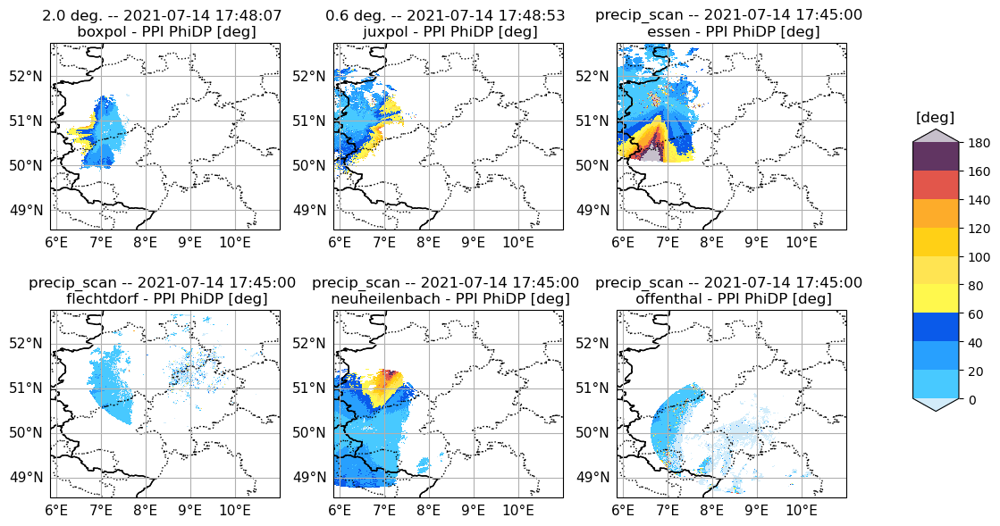

In [16]:
ropdp = {k1: tp.calib.calib_phidp.PhiDP_Calibration(robj)
         for k1, robj in rsnr.items()}
# Modify the PhiDP sign (only for JXP site)
for k1, rprm in RPARAMS.items():
    if rprm['site_name'] == 'Juxpol' and START_TIME.year > 2018:
        rprm['signpdp'] = -1
    else:
        rprm['signpdp'] = 1
for k1, robj in rsnr.items():
    robj.vars['PhiDP [deg]'] *= RPARAMS[k1]['signpdp']
[robj.offsetdetection_ppi(
    rsnr[k1].vars,
    preset=RPARAMS[k1]['phidp_prst'].get(START_TIME.strftime("%Y%m%d")))
    for k1, robj in ropdp.items()]
[robj.offset_correction(rsnr[k1].vars['PhiDP [deg]'],
                        phidp_offset=robj.phidp_offset,
                        data2correct=rsnr[k1].vars)
 for k1, robj in ropdp.items()]

for k1, robj in ropdp.items():
    print(f'{robj.site_name}_PhiDP_O '
          + f'[{robj.phidp_offset:.2f} deg]')
    robj.vars['PhiDP [deg]'] = np.ascontiguousarray(
        wrl.dp.unfold_phi(robj.vars['PhiDP [deg]'], robj.vars['rhoHV [-]'],
                          width=RPARAMS[k1]['wu_pdp'],
                          copy=True)).astype(np.float64)

tp.datavis.rad_display.plot_mgrid(
    [i.georef for k, i in rdata.items()], [i.params for k, i in rdata.items()],
    [i.vars for k, i in ropdp.items()], var2plot='PhiDP [deg]',
    cpy_feats={'status': True}, proj_suffix='utm',
    data_proj=ccrs.UTM(zone=32), xlims=xlims, ylims=ylims)

if PLOT_METHODS:
    [tp.datavis.rad_display.plot_ppi(rdata[k1].georef, rdata[k1].params,
                                     robj.vars, var2plot='PhiDP [deg]')
     for k1, robj in rsnr.items()]
    [tp.datavis.rad_display.plot_ppi(rdata[k1].georef, rdata[k1].params,
                                     robj.vars, var2plot='PhiDP [deg]')
     for k1, robj in ropdp.items()]

### Non-meteorological echoes identification and removal

I use the `lsinterference_filter` function to despeckle the radar data and filter out linear signatures that may arise due to external interference.

Then, I apply the `clutter_id` function to identify ground clutter, sea clutter, and anomalous propagation echoes. This identification process relies on the methodology established by **Rico-Ramirez, M. A., & Cluckie, I. D. (2008)**.

For C-band radars, I check if the clutter map generated by the DWD is available and use it to enhance the clutter identification algorithm's performance. However, it is worth noting that this algorithm is robust enough to accurately identify NME (non-meteorological echoes) even without DWD clutter maps.

For X-band radars, I generated membership functions (MFS) to detect non-meteorological echoes. These MFS were calibrated using data from both Boxpol and Juxpol radars. Additionally, I generated clutter maps for the lowest elevation angle scan. Clutter maps for Boxpol are available for each year from 2015 to 2021, while those for Juxpol are available for 2021.

In [17]:
rnme = {k1: tp.eclass.nme.NME_ID(robj) for k1, robj in ropdp.items()}
for k1, robj in rnme.items():
    if robj.site_name == 'Boxpol':
        pathmfscl = MFS_DIR
        if robj.scandatetime.year == 2017:
            clfmap = np.loadtxt(
                CLM_DIR + f'{robj.site_name.lower()}{robj.scandatetime.year}b'
                + '_cluttermap_el0.dat')
        else:
            clfmap = np.loadtxt(
                CLM_DIR + f'{robj.site_name.lower()}{robj.scandatetime.year}'
                + '_cluttermap_el0.dat')
        if RPARAMS['Boxpol']['elev'] != 'n_ppi_010deg':
            RPARAMS['Boxpol']['bclass'] -= 64
    elif robj.site_name == 'Juxpol':
        pathmfscl = None
        clfmap = np.loadtxt(CLM_DIR+f'{robj.site_name.lower()}'
                            # + f'{robj.scandatetime.year}'
                            + '2021' + '_cluttermap_el0.dat')
    else:
        pathmfscl = None
        rdata2 = tpx.Rad_scan(RSITE_FILES[robj.site_name], robj.site_name)
        # DWD clutter map is not always available,
        # these lines try to read such data
        try:
            rdata2.ppi_dwd(get_rvar='cmap')
            clfmap = 1 - tp.utils.radutilities.normalisenanvalues(
                rdata2.vars['cmap [class]'],
                np.nanmin(rdata2.vars['cmap [class]']),
                np.nanmax(rdata2.vars['cmap [class]']))
            clfmap = np.nan_to_num(clfmap, nan=1e-5)
            RPARAMS[k1]['bclass'] = 207
            pass
        except Exception:
            clfmap = None
            RPARAMS[k1]['bclass'] = 207 - 64
            print('CL Map not available')
            pass
    robj.lsinterference_filter(rdata[k1].georef, rdata[k1].params,
                               ropdp[k1].vars, data2correct=ropdp[k1].vars,
                               rhv_min=RPARAMS[k1]['rhvmin'],
                               # rhv_min=0.7,
                               plot_method=PLOT_METHODS)
    robj.clutter_id(rdata[k1].georef, rdata[k1].params, robj.vars,
                    path_mfs=pathmfscl, clmap=clfmap,
                    min_snr=rsnr[k1].min_snr, data2correct=robj.vars,
                    binary_class=RPARAMS[k1]['bclass'],
                    plot_method=PLOT_METHODS)

if PLOT_METHODS:
    [tp.datavis.rad_display.plot_ppi(rdata[k1].georef, rdata[k1].params,
                                     robj.vars)
     for k1, robj in rnme.items()]
    [tp.datavis.rad_display.plot_setppi(rdata[k1].georef, rdata[k1].params,
                                        robj.vars)
     for k1, robj in rnme.items()]

### Melting layer allocation

A MeltingLayer object is used to define the height of the top and bottom of the melting layer. These heights are important to delimit the rain region within the PPI scan. I used QVPs to detect the melting layer boundaries, as described in **Sanchez-Rivas and Rico-Ramirez (2021)**. Thus, an isotropic melting layer is assumed.

The ml_ppidelimitation function creates a PPI depicting the limits of the melting layer.

The melting layer height (MLH) is validated by examining the available QVP data. It is considered valid if the nearest data point is within the previous two hours. If not, I use the daily average of the MLH instead. Note that in this case, the MLH is deemed invalid for the Flechtdorf and Offenthal radar sites, so the daily average is applied.

Boxpol ML_h in database
Juxpol ML_h in database
Essen ML_h in database
Flechtdorf ML_h in database lies too far, using the day-average value
Neuheilenbach ML_h in database
Offenthal ML_h in database lies too far, using the day-average value
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain


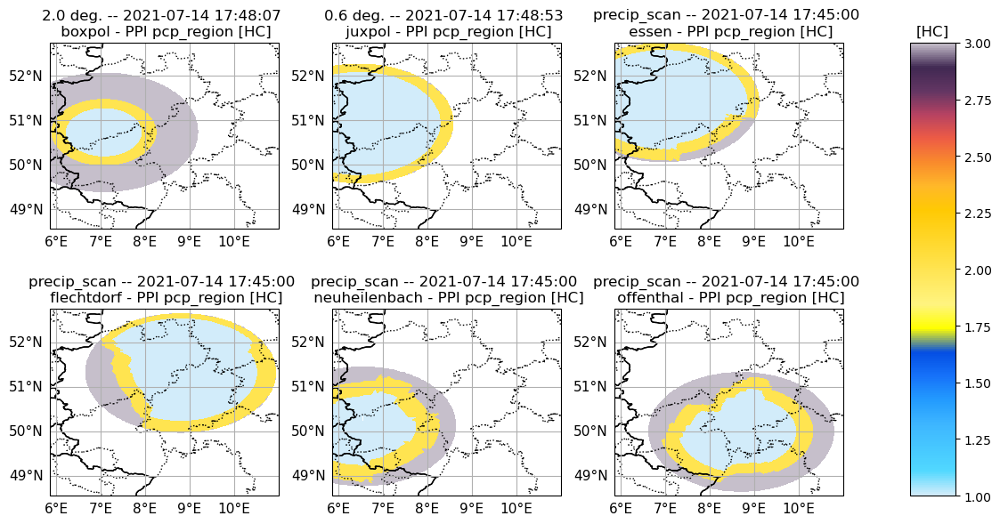

In [18]:
rmlyr = {k1: tp.ml.mlyr.MeltingLayer(robj) for k1, robj in rnme.items()}
for k1, robj in rmlyr.items():
    if idx_mlh[k1]:
        if ((abs((idx_mlh[k1][1] - robj.scandatetime).total_seconds())/60)
                <= max_diffdtmin):
            robj.ml_top = mlyrhv[k1][idx_mlh[k1][0]].ml_top
            robj.ml_bottom = mlyrhv[k1][idx_mlh[k1][0]].ml_bottom
            robj.ml_thickness = mlyrhv[k1][idx_mlh[k1][0]].ml_thickness
            if (np.isnan(robj.ml_thickness) and ~np.isnan(robj.ml_top)
                    and ~np.isnan(robj.ml_bottom)):
                robj.ml_thickness = robj.ml_top - robj.ml_bottom
            if (np.isnan(mlt_avg[k1]) and np.isnan(mlk_avg[k1])):
                print(f'{robj.site_name} ML_h not in database,'
                      + ' using the preset value')
                robj.ml_top = RPARAMS[k1]['mlt']
                robj.ml_thickness = RPARAMS[k1]['mlk']
                robj.ml_bottom = robj.ml_top-robj.ml_thickness
            else:
                print(f'{robj.site_name} ML_h in database')
        else:
            robj.ml_top = mlt_avg[k1]
            robj.ml_thickness = mlk_avg[k1]
            robj.ml_bottom = robj.ml_top - robj.ml_thickness
            print(f'{robj.site_name} ML_h in database lies too far,'
                  + ' using the day-average value')
    else:
        print(f'{robj.site_name} ML_h not in database,'
              + ' using the preset value')
        robj.ml_top = RPARAMS[k1]['mlt']
        robj.ml_thickness = RPARAMS[k1]['mlk']
        robj.ml_bottom = robj.ml_top-robj.ml_thickness

[robj.ml_ppidelimitation(rdata[k1].georef, rdata[k1].params, rnme[k1].vars,
                         plot_method=PLOT_METHODS)
 for k1, robj in rmlyr.items()]

tp.datavis.rad_display.plot_mgrid(
        [i.georef for k, i in rdata.items()],
        [i.params for k, i in rdata.items()],
        [i.mlyr_limits for k, i in rmlyr.items()],  # ncols=2, nrows=1,
        cpy_feats={'status': True}, proj_suffix='utm',
        data_proj=ccrs.UTM(zone=32), xlims=xlims, ylims=ylims)

if PLOT_METHODS:
    [tp.datavis.rad_display.plot_ppi(rdata[k1].georef, rdata[k1].params,
                                     robj.vars, mlyr=rmlyr[k1],
                                     var2plot='rhoHV [-]')
     for k1, robj in rnme.items()]
    

### Differential reflectivity $(Z_{DR})$ offset correction

Similarly, the $Z_{DR}$ offset was computed from QVPs, as described in **Sanchez-Rivas and Rico-Ramirez (2022)**.
The same time threshold is used to detect valid values of the $Z_{DR}$ offset. However, my approach for handling the $Z_{DR}$ offset in the QVPS involves extending the last valid detected offset until a new one is identified, ensuring continuity and stability in the data.

In [19]:
rozdr = {k1: tp.calib.calib_zdr.ZDR_Calibration(robj)
         for k1, robj in rmlyr.items()}
for k1, robj in rozdr.items():
    if idx_zdr0[k1]:
        if ((abs((idx_zdr0[k1][1] - robj.scandatetime).total_seconds())/60)
                <= max_diffdtmin):
            robj.zdr_offset = zdrOv[k1][idx_zdr0[k1][0]].zdr_offset
            if robj.zdr_offset == 0 or np.isnan(robj.zdr_offset):
                robj.zdr_offset = RPARAMS[k1]['zdr_offset']
                print(f'{robj.site_name}_ZDR_O void: [{robj.zdr_offset} dB]'
                      + ' -- using fixed value')
            else:
                print(f'{robj.site_name}_ZDR_O: '
                      + f'[{robj.zdr_offset:.2f} dB]')
        else:
            robj.zdr_offset = RPARAMS[k1]['zdr_offset']
            print(f'{robj.site_name}_ZDR_O dtvoid: [{robj.zdr_offset} dB]'
                  + ' -- dt in database far too long, using fixed value')
    else:
        robj.zdr_offset = RPARAMS[k1]['zdr_offset']
        print(f'{robj.site_name}_ZDR_O void: [{robj.zdr_offset} dB]'
              + ' -- using fixed value')

[robj.offset_correction(rnme[k1].vars['ZDR [dB]'], zdr_offset=robj.zdr_offset,
                        data2correct=rnme[k1].vars)
 for k1, robj in rozdr.items()]

if PLOT_METHODS:
    [tp.datavis.rad_display.plot_ppidiff(
        robj.georef, robj.params, rnme[k1].vars, rozdr[k1].vars,
        var2plot1='ZDR [dB]', var2plot2='ZDR [dB]', diff_lims=[-2, 2, .25])
     for k1, robj in rdata.items()]

Boxpol_ZDR_O: [-0.82 dB]
Juxpol_ZDR_O: [1.23 dB]
Essen_ZDR_O: [-0.26 dB]
Flechtdorf_ZDR_O: [-0.53 dB]
Neuheilenbach_ZDR_O: [0.05 dB]
Offenthal_ZDR_O: [-0.27 dB]


### Radar reflectivity $(Z_H)$ attenuation correction

The attenuation of $Z_H$ in the liquid phase of precipitation is addressed through a robust methodology proposed by **Rico-Ramirez, M. A. (2012).**

Initially, the differential phase $\Phi_{DP}$ undergoes a thorough processing sequence that includes smoothing, filtering, and interpolating of the signal phase. This is accomplished using the `attc_phidp_prepro` function, which refines the phase data.

The `zh_correction` function provides different methods to correct $Z_H$ for attenuation effects. I use the ABRI method, a ray-wise, optimised extension of the methodology proposed by Bringi, V. N. et al. (2001), where the optimal values of $a, b,$ and $\alpha$ are calculated, as proposed by **Rico-Ramirez, M. A. (2012)**. The ranges of values used to find the optimal values are adapted from **Diederich, M. et al (2015)**, **Park, S. G. et al (2005)**, **Rico-Ramirez, M. A. (2012)** and **Trömel et al. (2014)**. 

While this methodology is robust, I noticed that using a broad range of $\alpha$ values (from 0.02 to 0.18) in light rain conditions was impractical. This approach tends to converge abnormally and results in an overestimation of the specific attenuation $A_H$. This issue is likely caused by the noisy and non-monotonic values of $\Phi_{DP}$ in the light rain region, where ray segmentation can be subjective.

To address this challenge, I utilise QVPs. I propose partitioning the $\alpha$ range based on the rain intensity identified through QVP classification. Specifically, I limit the search for the optimal $\alpha$ value to a range of 0.05 to 0.1 during light rain, while for moderate to heavy rain, I use a range from 0.1 to 0.18.

It is essential to highlight that attenuation calculation is restricted to the region up to the bottom of the melting layer within the PPI (Plan Position Indicator) scan.

scan HR-X-[0.3, 0.5, 0.45]
scan HR-X-[0.3, 0.5, 0.45]
scan HR-C-[0.1, 0.18, 0.15]
scan LR-C-[0.05, 0.1, 0.05]
scan HR-C-[0.1, 0.18, 0.15]
scan LR-C-[0.05, 0.1, 0.05]
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain


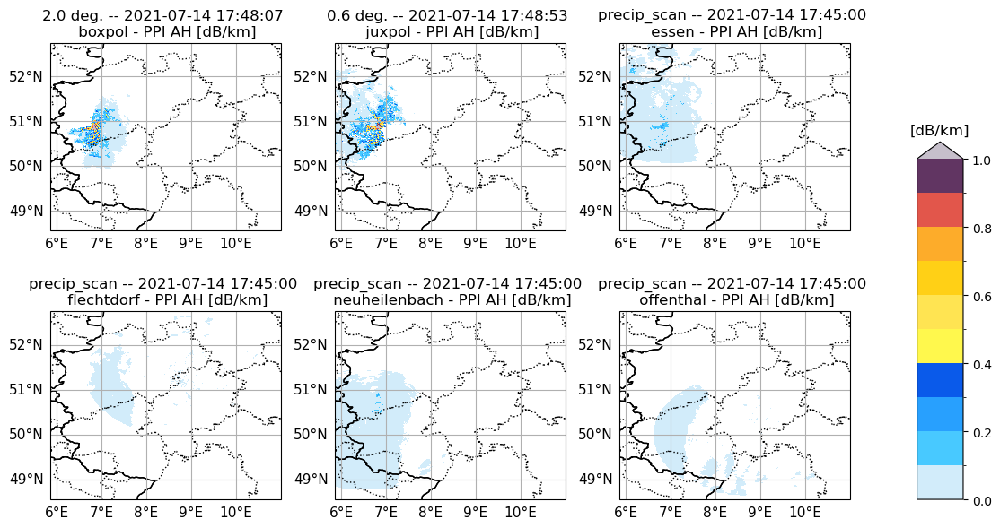

In [20]:
rattc = {k1: tp.attc.attc_zhzdr.AttenuationCorrection(robj)
         for k1, robj in rdata.items()}

for k1, robj in rattc.items():
    if idx_pclass[k1]:
        if ((abs((idx_pclass[k1][1] - robj.scandatetime).total_seconds())/60)
                <= max_diffdtmin):
            robj.pcp_type = profs_data[k1]['pcp_type'][idx_pclass[k1][0]]
        else:
            robj.pcp_type = 2
    else:
        robj.pcp_type = 2
    if rbands[k1] == 'C' and (robj.pcp_type == 0 or robj.pcp_type == 1
                              or robj.pcp_type == 4):
        robj.att_alphai = [0.05, 0.1, 0.05]  # Light to moderate rain
        robj.att_betaalphar = 0.39  # Continental
        # robj.att_betaalphar = 0.14  # Tropical
        print(f'scan LR-{rbands[k1]}-{robj.att_alphai}')
    elif rbands[k1] == 'C' and (robj.pcp_type == 2 or robj.pcp_type == 5):
        robj.att_alphai = [0.1, 0.18, 0.10]  # Moderate to heavy rain
        robj.att_betaalphar = 0.27  # medval
        print(f'scan MR-{rbands[k1]}-{robj.att_alphai}')
    elif rbands[k1] == 'C' and (robj.pcp_type == 3 or robj.pcp_type == 6):
        robj.att_alphai = [0.1, 0.18, 0.15]  # Moderate to heavy rain
        robj.att_betaalphar = 0.14  # Tropical
        # robj.att_betaalphar = 0.39  # Continental
        # att_alpha = [0.05, 0.18, 0.11]  # Light - heavy rain
        print(f'scan HR-{rbands[k1]}-{robj.att_alphai}')
    if rbands[k1] == 'X' and (robj.pcp_type == 0 or robj.pcp_type == 1
                              or robj.pcp_type == 4):
        robj.att_alphai = [0.15, 0.30, 0.15]  # Light rain PARK
        robj.att_betaalphar = 0.19  # Continental
        # robj.att_betaalphar = 0.14  # Tropical
        print(f'scan LR-{rbands[k1]}-{robj.att_alphai}')
    elif rbands[k1] == 'X' and (robj.pcp_type == 2 or robj.pcp_type == 5):
        robj.att_alphai = [0.30, 0.50, 0.30]  # Moderate to heavy rain PARK
        robj.att_betaalphar = 0.17  # medval
        print(f'scan MR-{rbands[k1]}-{robj.att_alphai}')
    elif rbands[k1] == 'X' and (robj.pcp_type == 3 or robj.pcp_type == 6):
        robj.att_alphai = [0.30, 0.50, 0.45]  # Moderate to heavy rain PARK
        robj.att_betaalphar = 0.14  # Tropical
        # robj.att_betaalphar = 0.19  # Continental
        # att_alpha = [0.15, 0.35, 0.22]  # Light - heavy rain
        print(f'scan HR-{rbands[k1]}-{robj.att_alphai}')

[robj.attc_phidp_prepro(
    rdata[k1].georef, rdata[k1].params, rozdr[k1].vars, rhohv_min=0.85,
    phidp0_correction=(True if robj.site_name == 'Offenthal'
                       or robj.site_name == 'Neuheilenbach'
                       # or robj.site_name == 'Flechtdorf'
                       # or robj.site_name == 'Hannover'
                       else False))
 for k1, robj in rattc.items()]

if PLOT_METHODS:
    [tp.datavis.rad_display.plot_ppi(rdata[k1].georef, rdata[k1].params,
                                     robj.vars, var2plot='PhiDP [deg]')
     for k1, robj in rozdr.items()]
    [tp.datavis.rad_display.plot_ppi(rdata[k1].georef, rdata[k1].params,
                                     robj.vars, var2plot='PhiDP [deg]')
     for k1, robj in rattc.items()]

[robj.zh_correction(rdata[k1].georef, rdata[k1].params, rattc[k1].vars,
                    rnme[k1].nme_classif['classif [EC]'], mlyr=rmlyr[k1],
                    attc_method='ABRI', pdp_dmin=1, pdp_pxavr_azm=3,
                    pdp_pxavr_rng=round(4000/rdata[k1].params['gateres [m]']),
                    coeff_alpha=robj.att_alphai, phidp0=0,
                    # coeff_a=[9.781e-5, 1.749e-4, 1.367e-4],  # Park
                    # coeff_b=[0.757, 0.804, 0.78],  # Park
                    coeff_a=[5.50e-5, 1.62e-4, 9.745e-05],  # Diederich
                    coeff_b=[0.74, 0.86, 0.8],  # Diederich
                    plot_method=PLOT_METHODS)
 if 'xpol' in robj.site_name.lower() else
 robj.zh_correction(rdata[k1].georef, rdata[k1].params, rattc[k1].vars,
                    rnme[k1].nme_classif['classif [EC]'], mlyr=rmlyr[k1],
                    attc_method='ABRI', pdp_dmin=1, pdp_pxavr_azm=3,
                    pdp_pxavr_rng=round(4000/rdata[k1].params['gateres [m]']),
                    coeff_alpha=robj.att_alphai, phidp0=0,
                    # coeff_a=[1.59e-5, 4.27e-5, 2.49e-05],  # Diederich
                    # coeff_b=[0.73, 0.77, 0.755],  # Diederich
                    coeff_a=[1e-5, 4.27e-5, 3e-05],  # MRR+Diederich
                    coeff_b=[0.73, 0.85, 0.78],  # MRR+Diederich
                    plot_method=PLOT_METHODS)
 for k1, robj in rattc.items()]

for k1, robj in rattc.items():
    robj.phidp_offset -= ropdp[k1].phidp_offset

tp.datavis.rad_display.plot_mgrid(
        [i.georef for k, i in rdata.items()], [i.params for k, i in rdata.items()],
        [i.vars for k, i in rattc.items()], var2plot='AH [dB/km]',
        cpy_feats={'status': True}, proj_suffix='utm', data_proj=ccrs.UTM(zone=32),
        vars_bounds={'AH [dB/km]': [0 ,1, 11]}, xlims=xlims, ylims=ylims)

if PLOT_METHODS:
    [tp.datavis.rad_display.plot_ppi(rdata[k1].georef, rdata[k1].params,
                                     robj.vars, var2plot='AH [dB/km]')
     for k1, robj in rattc.items()]

### Computation of $Z_H(A_H)$

Partial beam blockage, radar miscalibration, and wet radome effects are handled using the methodology introduced by **Diederich et al. (2015)**, which derives radar reflectivity $(Z_H)$ from specific attenuation $(A_H)$.

I set the temperature in the `rzhah.ah_zh` function to 15°C (a fair assumption for Germany during rain).

To ensure a smooth computation of $Z_H$ from $A_H$, I fine-tune the outputs by applying a moving average filter. I choose this approach because $A_H$ can sometimes show significant variability; the $A_H(Z_H)$ relationships are valid for $20 < Z_H < 50 dBZ$, which can result in visible streaks in the final results. By refining these outputs, I aim to achieve a smoother and more visually coherent representation of the data.

[None, None, None, None, None, None]

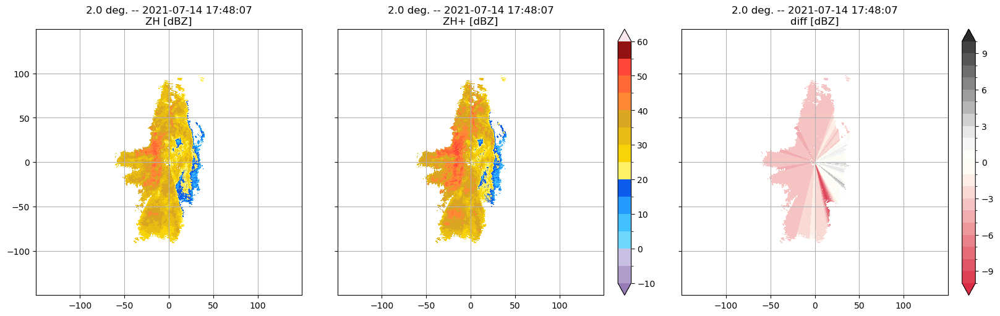

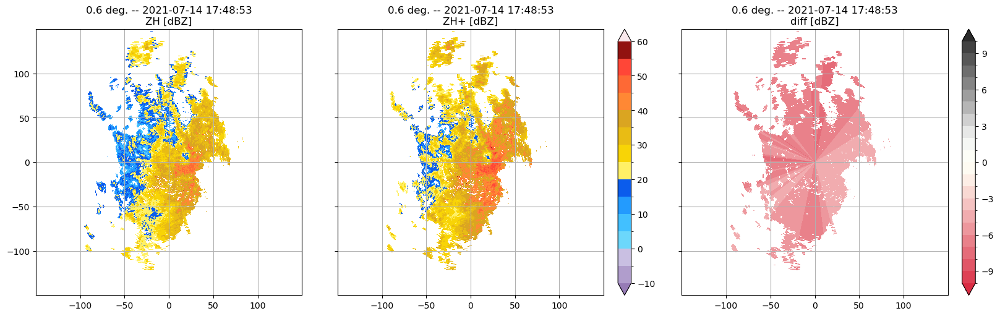

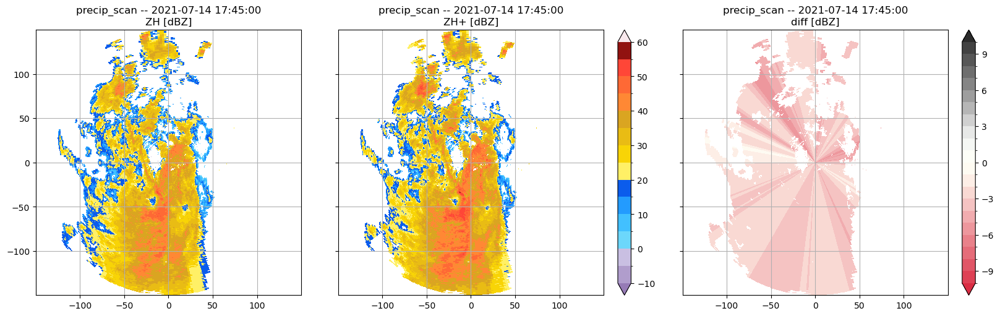

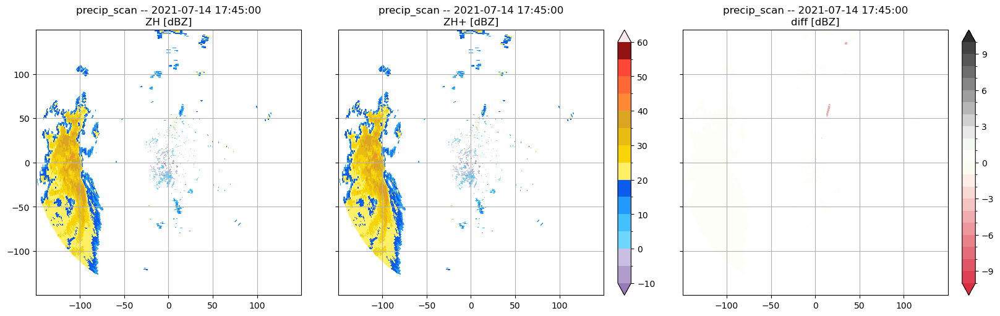

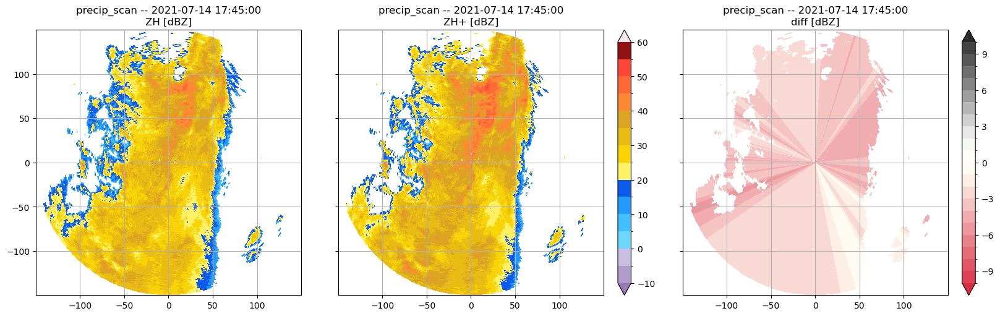

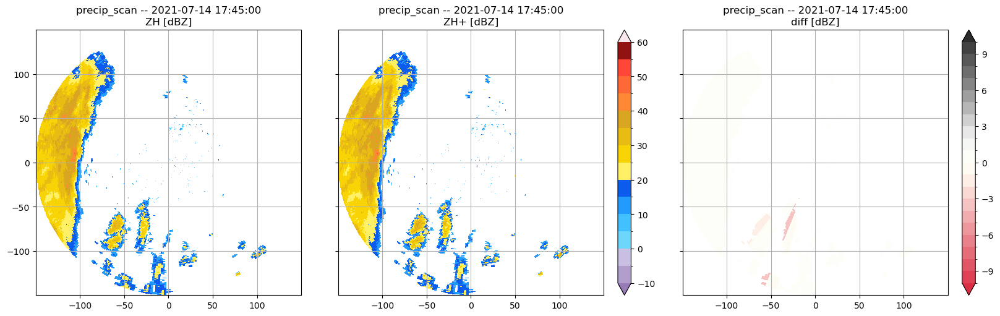

In [21]:
temp = 15
rzhah = {k1: tp.attc.r_att_refl.Attn_Refl_Relation(robj)
         for k1, robj in rdata.items()}
zhah_lim = {k1: [20, 55] for k1, robj in rzhah.items()}
[robj.ah_zh(rattc[k1].vars, zh_lower_lim=zhah_lim[k1][0], temp=temp,
            rband=rbands[robj.site_name], zh_upper_lim=zhah_lim[k1][1],
            data2correct=rattc[k1].vars, plot_method=PLOT_METHODS)
 for k1, robj in rzhah.items()]

mov_avrgf_len = (1, 7)

for k1, robj in rattc.items():
    zh_difnan = np.where(rzhah[k1].vars['diff [dBZ]'] == 0,
                         np.nan, rzhah[k1].vars['diff [dBZ]'])
    zhpdiff = np.array([np.nanmedian(i) if ~np.isnan(np.nanmedian(i)) else 0
                        for cnt, i in enumerate(zh_difnan)])
    zhpdiff_pad = np.pad(zhpdiff, mov_avrgf_len[1]//2,
                         mode='wrap')
    zhplus_maf = np.ma.convolve(
        zhpdiff_pad, np.ones(mov_avrgf_len[1])/mov_avrgf_len[1], mode='valid')
    robj.vars['ZH+ [dBZ]'] = np.array(
        [robj.vars['ZH [dBZ]'][cnt] - i if i == 0
         else robj.vars['ZH [dBZ]'][cnt] - zhplus_maf[cnt]
         for cnt, i in enumerate(zhpdiff)])

[tp.datavis.rad_display.plot_ppidiff(
    robj.georef, robj.params, rattc[k1].vars, rattc[k1].vars,
    var2plot1='ZH [dBZ]', var2plot2='ZH+ [dBZ]')
 for k1, robj in rdata.items()]

### $Z_{DR}$ attenuation correction

I correct the differential horizontal reflectivity for differential attenuation using a ray-wise optimised attenuation method adapted from **Bringi, V. N. et al. (2001)**.

The `zdr_correction` function requires the outputs of the attenuation correction (more specifically, parameter $\alpha$) to compute the specific differential attenuation $(A_{DP} [dB/km])$. Additionally, I use the $Z_H-Z_{DR}$ relation derived specifically for Germany by **Chen et. al. (2021)** to improve the outputs of this methodology. The $\beta/\alpha$ ratio is adapted from **Ryzhkov and Zrnic (2019)** and it is also modified according to the QVPs rain intensity classification.

[None, None, None, None, None, None]

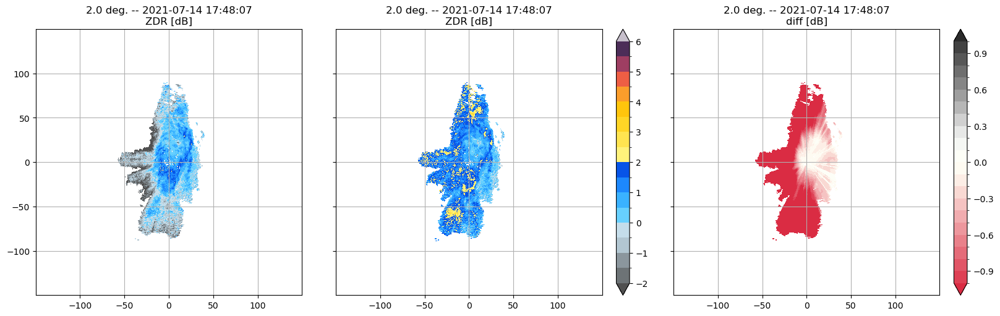

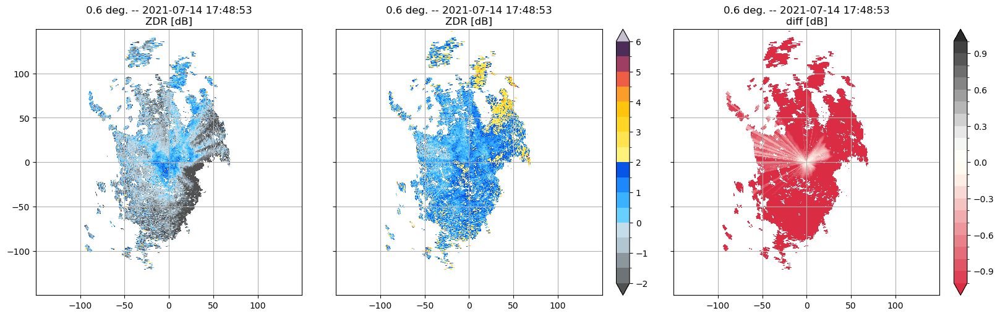

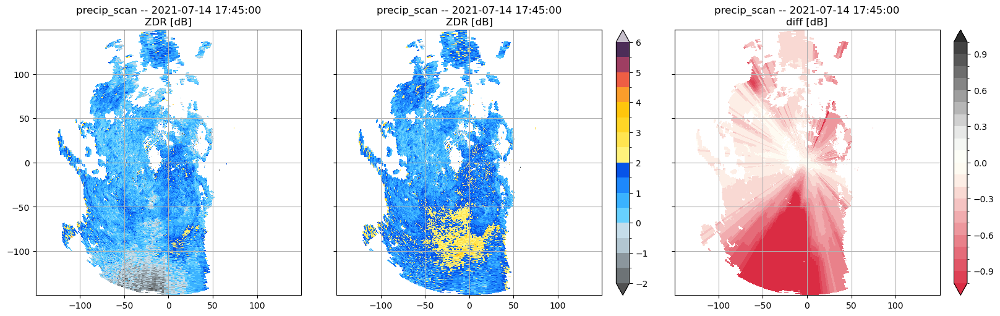

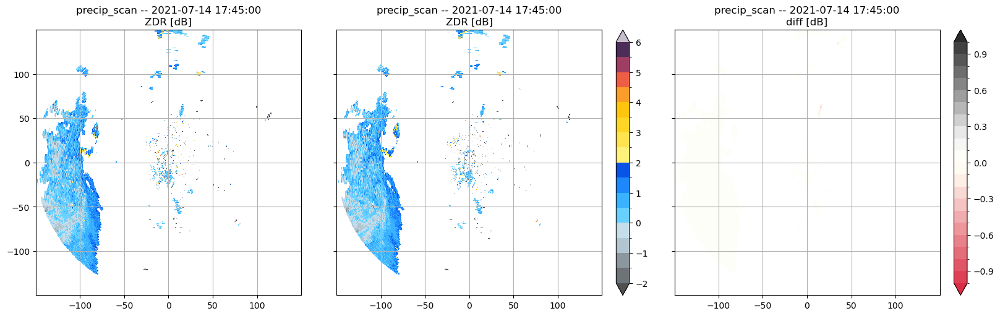

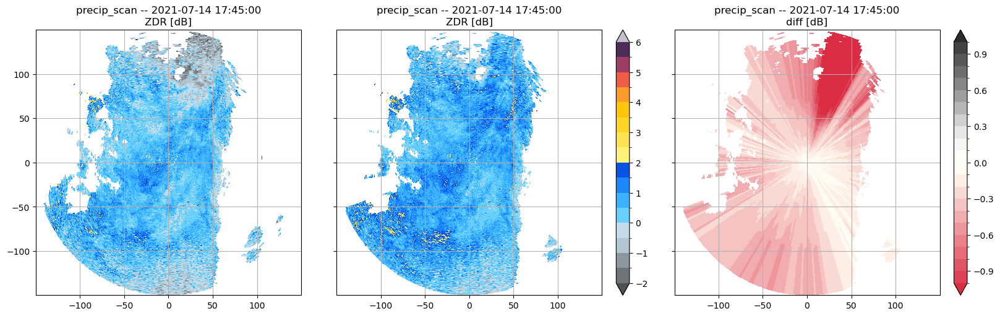

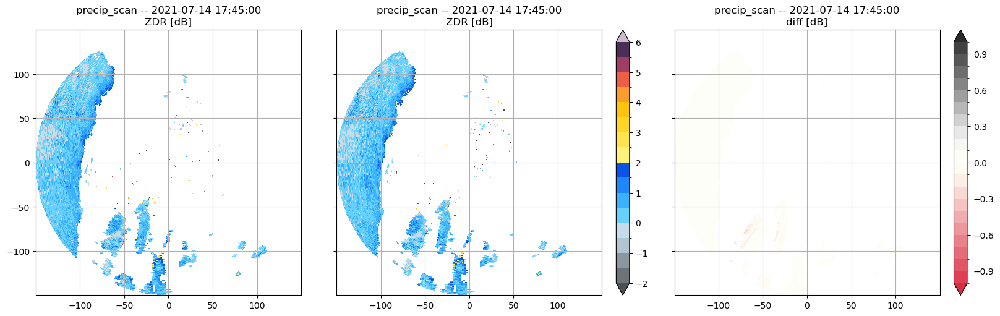

In [22]:
zdr_attcc = (9, 5, 3)
zdr_attcx = (7, 10, 5)
[robj.zdr_correction(
    rdata[k1].georef, rdata[k1].params, rozdr[k1].vars, rzhah[k1].vars,
    rnme[k1].nme_classif['classif [EC]'], mlyr=rmlyr[k1], attc_method='BRI',
    coeff_beta=RPARAMS[k1]['beta'], beta_alpha_ratio=robj.att_betaalphar,
    rhv_thld=RPARAMS[k1]['rhvatt'], plot_method=PLOT_METHODS,
    zh_zdr_model='exp', rparams={'coeff_a': RPARAMS[k1]['zdrzh_a'],
                                 'coeff_b': RPARAMS[k1]['zdrzh_b']},
    mov_avrgf_len=(zdr_attcc[0] if rbands[k1] == 'C' else zdr_attcx[0]),
    minbins=(zdr_attcc[1] if rbands[k1] == 'C' else zdr_attcx[1]),
    p2avrf=(zdr_attcc[2] if rbands[k1] == 'C' else zdr_attcx[2]))
 for k1, robj in rattc.items()]

[tp.datavis.rad_display.plot_ppidiff(
    robj.georef, robj.params, rozdr[k1].vars, rattc[k1].vars,
    var2plot1='ZDR [dB]', var2plot2='ZDR [dB]', diff_lims=[-1, 1, .1])
 for k1, robj in rdata.items()]

### Specific differential phase $(K_{DP})$ calculation

I derive $K_{DP}$ through an integration of methodologies, specifically by combining the technique proposed by **Vulpiani et al. (2012)** (implemented on wradlib's `phidp_kdp_vulpiani` function), with the $K_{DP}$ values derived from $A_H$. This relationship is expressed as follows:

$K_{DP}=A_H/\alpha$.

Calculating a ray-wise-$\alpha$ allows for a reliable derivation of $K_{DP}$ using the previously mentioned relation.

It is noteworthy that $\Phi_{DP}$ has already undergone sufficient filtering and smoothing in earlier steps, allowing for a relatively small window size to be used in the `phidp_kdp_vulpiani` function, ensuring reliable and high-resolution values of $K_{DP}$.

In the rain region, negative $K_{DP}$ values are set to zero based on a threshold of 5 dBZ in $Z_H$.
I use thresholds on $Z_H$ (< 55 dBZ) and $\rho_{HV}$ (0.95) to address the potential but well-known impact of hail on $A_H$.

Combining these two methodologies enhances the resolution of this "synthetic" $K_{DP}$, making it nearly equivalent to the resolution of $A_H$ in high rain rates. This enhancement aims to improve the accuracy of quantitative precipitation estimation (QPE).

©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain


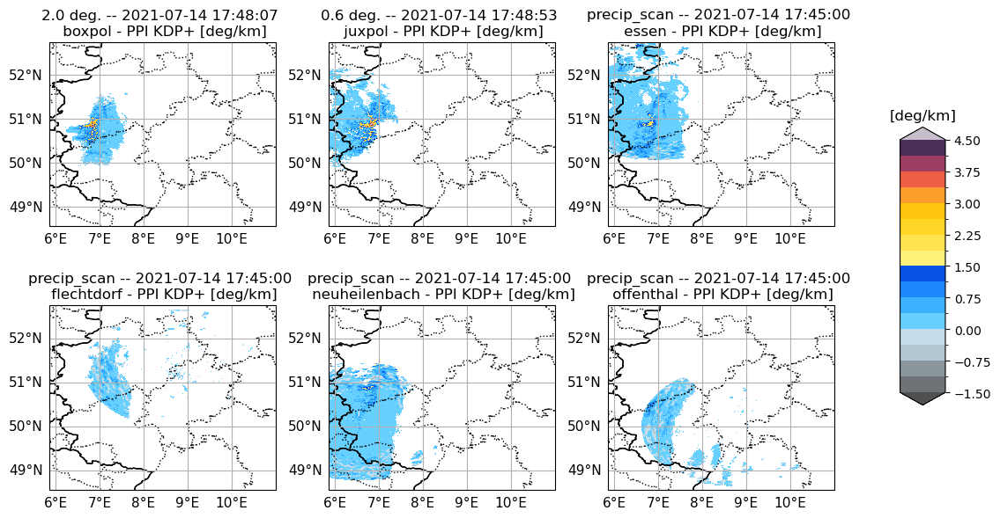

In [23]:
for k1, robj in rattc.items():
    if rbands[robj.site_name] == 'C':
        zh_kdp = 'ZH+ [dBZ]'
    elif rbands[robj.site_name] == 'X':
        zh_kdp = 'ZH+ [dBZ]'
    v = {}
    v['PhiDP [deg]'], v['KDP [deg/km]'] = kdpvpi(
        robj.vars['PhiDP [deg]'], dr=rdata[k1].params['gateres [m]']/1000,
        winlen=RPARAMS[k1]['kdpwl'])
    # Remove NME
    v['KDP* [deg/km]'] = np.where(rnme[k1].nme_classif['classif [EC]'] != 0,
                                  np.nan, v['KDP [deg/km]'])
    v['PhiDPv [deg]'] = np.where(rnme[k1].nme_classif['classif [EC]'] != 0,
                                 np.nan, v['PhiDP [deg]'])
    # Remove negative KDP values in rain region and within ZH threshold
    robj.vars['KDP* [deg/km]'] = np.where(
        (rmlyr[k1].mlyr_limits['pcp_region [HC]'] == 1)
        & (v['KDP [deg/km]'] < 0) & (robj.vars[zh_kdp] > 5),  # 0
        0, v['KDP* [deg/km]'])
    v['KDP+ [deg/km]'] = np.where((
        robj.vars[zh_kdp] >= 40) & (robj.vars[zh_kdp] < 55)
        & (rozdr[k1].vars['rhoHV [-]'] >= 0.95)
        & (~np.isnan(robj.vars['KDP [deg/km]']))
        & (robj.vars['KDP [deg/km]'] != 0),
        robj.vars['KDP [deg/km]'], robj.vars['KDP* [deg/km]'])
    robj.vars['KDP+ [deg/km]'] = v['KDP+ [deg/km]']
    # robj.vars['PhiDPv [deg]'] = v['PhiDPv [deg]']

tp.datavis.rad_display.plot_mgrid(
    [i.georef for k, i in rdata.items()],
    [i.params for k, i in rdata.items()],
    [i.vars for k, i in rattc.items()], ncols=3, nrows=2,
    cpy_feats={'status': True}, proj_suffix='utm',
    data_proj=ccrs.UTM(zone=32), xlims=xlims, ylims=ylims,
    var2plot='KDP+ [deg/km]', vars_bounds={'KDP [deg/km]': (-1.5, 4.5, 17)})

if PLOT_METHODS:
    [tp.datavis.rad_display.plot_ppidiff(
        robj.georef, robj.params, rattc[k1].vars, rattc[k1].vars,
        var2plot1='KDP* [deg/km]', var2plot2='KDP+ [deg/km]',
        diff_lims=[-1, 1, 0.1], vars_bounds={'KDP [deg/km]': (-1.5, 4.5, 17)})
     for k1, robj in rdata.items()]

## Rainfall estimation

Here, I'll define some parameters for the QPE:
- `qpe_amlb`: This parameter indicates whether the QPE is computed above the bottom of the melting layer. In this example, it is set to False, meaning that the QPE is calculated only in the rain region, excluding the bright-band area and the solid precipitation region in the plan position indicator (PPI). **See below for more details on this option**.
- `z_thld`: This refers to the $Z_H$ threshold used in various hybrid estimators, and is related to heavy rain.
- `thr_zwsnw` and `thr_zhail`: These are $Z_H$ thresholds used to differentiate between wet snow and hail.
- `rprods`: This parameter refers to the rain retrievals that will be computed.
- `r_coeffs`: This modifies some relationship coefficients, utilising those derived from Chen et al. for different events.

In [24]:
qpe_amlb = False
z_thld = 40
thr_zhail = 55
thr_zwsnw = 0  # Not used as the ML was previously defined

In [25]:
rprods_dp = ['r_adp', 'r_ah', 'r_kdp', 'r_z']
rprods_hbr = ['r_ah_kdp', 'r_kdp_zdr', 'r_z_ah', 'r_z_kdp', 'r_z_zdr']
rprods_opt = ['r_kdpopt', 'r_zopt']
rprods_hyop = ['r_ah_kdpopt', 'r_zopt_ah', 'r_zopt_kdp', 'r_zopt_kdpopt']
rprods_nmd = ['r_aho_kdpo', 'r_kdpo', 'r_zo', 'r_zo_ah', 'r_zo_kdp',
              'r_zo_zdr']

rprods = sorted(rprods_dp[1:] + rprods_hbr + rprods_opt + rprods_hyop
                + ['r_aho_kdpo', 'r_zo', 'r_kdpo'])

adpr = 'ADP [dB/km]'
ahr = 'AH [dB/km]'
kdpr = 'KDP+ [deg/km]'  # Vulpiani+AH
zdrr = 'ZDR [dB]'
zh_kdpo = {k1: 'ZH+ [dBZ]' if rb == 'X' else 'ZH+ [dBZ]'
           for k1, rb in rbands.items()}
zh_zho = {k1: 'ZH+ [dBZ]' if rb == 'X' else 'ZH+ [dBZ]'
          for k1, rb in rbands.items()}
zh_r = {k1: 'ZH+ [dBZ]' if rb == 'X' else 'ZH+ [dBZ]'
        for k1, rb in rbands.items()}
kdp_kdpo = {k1: 'KDP [deg/km]' if rb == 'X' else 'KDP [deg/km]'
            for k1, rb in rbands.items()}
r_coeffs = {robj.site_name: {} for k1, robj in rattc.items()}
for k1, robj in rattc.items():
    if rbands[robj.site_name] == 'C':
        if START_TIME.date() == dt.date(2021, 7, 14):
            r_coeffs[k1]['rz_a'] = (1/0.026)**(1/0.69)
            r_coeffs[k1]['rz_b'] = 1/0.69  # Chen2023
            r_coeffs[k1]['rkdp_a'] = 30.6
            r_coeffs[k1]['rkdp_b'] = 0.71  # Chen2023
            r_coeffs[k1]['rah_a'] = 427
            r_coeffs[k1]['rah_b'] = 0.94  # Chen2023
        else:
            r_coeffs[k1]['rz_a'] = (1/0.052)**(1/0.57)
            r_coeffs[k1]['rz_b'] = 1/0.57  # Chen2021
            r_coeffs[k1]['rkdp_a'] = 20.7
            r_coeffs[k1]['rkdp_b'] = 0.72  # Chen2021
            r_coeffs[k1]['rah_a'] = 307
            r_coeffs[k1]['rah_b'] = 0.92  # Chen2021
    elif rbands[k1] == 'X':
        if START_TIME.date() == dt.date(2021, 7, 14):
            r_coeffs[k1]['rz_a'] = (1/0.057)**(1/0.57)
            r_coeffs[k1]['rz_b'] = 1/0.57  # Chen2023
            r_coeffs[k1]['rkdp_a'] = 22.9
            r_coeffs[k1]['rkdp_b'] = 0.76  # Chen2023
            r_coeffs[k1]['rah_a'] = 67
            r_coeffs[k1]['rah_b'] = 0.78  # Chen2023
        else:
            r_coeffs[k1]['rz_a'] = (1/0.098)**(1/0.47)
            r_coeffs[k1]['rz_b'] = 1/0.47  # Chen2021
            r_coeffs[k1]['rkdp_a'] = 15.6
            r_coeffs[k1]['rkdp_b'] = 0.83  # Chen2021
            r_coeffs[k1]['rah_a'] = 38
            r_coeffs[k1]['rah_b'] = 0.69  # Chen2021

#### Traditional estimators

In [26]:
rqpe = {k1: tp.qpe.qpe_algs.RadarQPE(robj) for k1, robj in rdata.items()}

if 'r_adp' in rprods:
    [robj.adp_to_r(rattc[k1].vars[adpr], mlyr=rmlyr[k1], temp=temp,
                   rband=rbands[robj.site_name],
                   beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe.items()]
if 'r_ah' in rprods:
    [robj.ah_to_r(rattc[k1].vars[ahr], mlyr=rmlyr[k1], temp=temp,
                  rband=rbands[robj.site_name],
                  beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe.items()]
if 'r_kdp' in rprods:
    [robj.kdp_to_r(rattc[k1].vars[kdpr], mlyr=rmlyr[k1],
                   a=RPARAMS[k1]['rkdp_a'], b=RPARAMS[k1]['rkdp_b'],
                   beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe.items()]
if 'r_z' in rprods:
    [robj.z_to_r(rattc[k1].vars[zh_r[robj.site_name]], mlyr=rmlyr[k1],
                 a=RPARAMS[k1]['rz_a'], b=RPARAMS[k1]['rz_b'],
                 beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe.items()]

#### Hybrid estimators

In [27]:
if 'r_kdp_zdr' in rprods:
    [robj.kdp_zdr_to_r(rattc[k1].vars[kdpr], rattc[k1].vars[zdrr],
                       mlyr=rmlyr[k1], a=RPARAMS[k1]['rkdpzdr_a'],
                       b=RPARAMS[k1]['rkdpzdr_b'], c=RPARAMS[k1]['rkdpzdr_c'],
                       beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe.items()]
if 'r_z_ah' in rprods:
    [robj.z_ah_to_r(rattc[k1].vars[zh_r[robj.site_name]],
                    rattc[k1].vars[ahr], mlyr=rmlyr[k1],
                    rz_a=RPARAMS[k1]['rz_a'], rz_b=RPARAMS[k1]['rz_b'],
                    rband=rbands[robj.site_name], temp=temp, z_thld=z_thld,
                    beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe.items()]
if 'r_z_kdp' in rprods:
    [robj.z_kdp_to_r(rattc[k1].vars[zh_r[robj.site_name]],
                     rattc[k1].vars[kdpr], z_thld=z_thld, mlyr=rmlyr[k1],
                     rz_a=RPARAMS[k1]['rz_a'], rz_b=RPARAMS[k1]['rz_b'],
                     rkdp_a=RPARAMS[k1]['rkdp_a'],
                     rkdp_b=RPARAMS[k1]['rkdp_b'],
                     beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe.items()]
if 'r_z_zdr' in rprods:
    [robj.z_zdr_to_r(rattc[k1].vars[zh_r[robj.site_name]],
                     rattc[k1].vars[zdrr], mlyr=rmlyr[k1],
                     a=RPARAMS[k1]['rzhzdr_a'], b=RPARAMS[k1]['rzhzdr_b'],
                     c=RPARAMS[k1]['rzhzdr_c'],
                     beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe.items()]
if 'r_ah_kdp' in rprods:
    [robj.ah_kdp_to_r(
        rattc[k1].vars[zh_r[robj.site_name]], rattc[k1].vars[ahr],
        rattc[k1].vars[kdpr], mlyr=rmlyr[k1], rband=rbands[robj.site_name],
        temp=temp, z_thld=z_thld,
        rkdp_a=RPARAMS[k1]['rkdp_a'], rkdp_b=RPARAMS[k1]['rkdp_b'],
        beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe.items()]

#### Adaptive estimators

In [28]:
rqpe_opt = {k1: tp.qpe.qpe_algs.RadarQPE(robj) for k1, robj in rattc.items()}
rqpe_opt2 = {k1: tp.qpe.qpe_algs.RadarQPE(robj)
             for k1, robj in rattc.items()}
if 'r_kdpopt' in rprods:
    rkdp_fit = {k1: tpx.rkdp_opt(
        rattc[k1].vars[kdp_kdpo[robj.site_name]],
        rattc[k1].vars[zh_kdpo[robj.site_name]],
        rkdp_stv=(RPARAMS[k1]['rkdp_a'], RPARAMS[k1]['rkdp_b']),
        zh_thr=((40, 50) if rbands[robj.site_name] == 'X' else (44.5, 45.5)),
        kdpmed=0.5, mlyr=rmlyr[k1], rband=rbands[robj.site_name],
        ptitle_pfx=f'{robj.elev_angle}'
        + f'{(" deg." if rbands[robj.site_name] == "X" else "")}'
        + f' -- {robj.scandatetime.strftime("%Y-%m-%d %H:%M:%S")}',
        plot_method=PLOT_METHODS)
                for k1, robj in rqpe_opt.items()}
    [robj.kdp_to_r(rattc[k1].vars[kdpr], mlyr=rmlyr[k1],
                   a=rkdp_fit[k1][0], b=rkdp_fit[k1][1],
                   beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe_opt.items()]
    for k1, robjz in rqpe.items():
        robjz.r_kdpopt = rqpe_opt[k1].r_kdp
if 'r_zopt' in rprods:
    rzh_fit = {k1: tpx.rzh_opt(
        rattc[k1].vars[zh_zho[robj.site_name]], rqpe[k1].r_ah,
        rattc[k1].vars['AH [dB/km]'], pia=rattc[k1].vars['PIA [dB]'],
        mlyr=rmlyr[k1], zh_hail=thr_zhail, minpia=(0.1), fit_ab=False,
        maxpia=(100 if rbands[robj.site_name] == 'X' else 100),
        rzfit_b=(2.14 if rbands[robj.site_name] == 'X' else 1.6),
        rz_stv=[[RPARAMS[k1]['rz_a'], RPARAMS[k1]['rz_b']],
                [r_coeffs[k1]['rz_a'], r_coeffs[k1]['rz_b']]],
        rz_stv_names={'trah': 'Diederich et al., 2015a',
                      'trzh': ['Diederich et al., 2015b'
                               if rbands[robj.site_name] == 'X' else
                               'Chen et al., 2021',
                               'Chen et al., 2023']},
        figlims_ah=((0, 3) if rbands[robj.site_name] == 'X' else (0, 0.5)),
        plot_method=PLOT_METHODS, plot_type='log',
        # ptitle_pfx=f'{robj.elev_angle}'
        # + f'{(" deg." if rbands[robj.site_name] == "X" else "")}'
        # + f' -- {robj.scandatetime.strftime("%Y-%m-%d %H:%M:%S")}'
        )
        for k1, robj in rqpe_opt.items()}
    [robj.z_to_r(rattc[k1].vars[zh_r[robj.site_name]], mlyr=rmlyr[k1],
                 a=rzh_fit[k1][0], b=rzh_fit[k1][1],
                 beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe_opt.items()]
    for k1, robjz in rqpe.items():
        robjz.r_zopt = rqpe_opt[k1].r_z
if 'r_zopt_ah' in rprods and 'r_zopt' in rprods:
    [robj.z_ah_to_r(rattc[k1].vars[zh_r[robj.site_name]],
                    rattc[k1].vars[ahr],
                    rz_a=rzh_fit[k1][0], rz_b=rzh_fit[k1][1],
                    rband=rbands[robj.site_name], temp=temp, z_thld=z_thld,
                    mlyr=rmlyr[k1],
                    beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe_opt.items()]
    for k1, robjz in rqpe.items():
        robjz.r_zopt_ah = rqpe_opt[k1].r_z_ah
if 'r_zopt_kdp' in rprods and 'r_zopt' in rprods:
    [robj.z_kdp_to_r(rattc[k1].vars[zh_r[robj.site_name]],
                     rattc[k1].vars[kdpr], z_thld=z_thld, mlyr=rmlyr[k1],
                     rz_a=rzh_fit[k1][0], rz_b=rzh_fit[k1][1],
                     rkdp_a=RPARAMS[k1]['rkdp_a'],
                     rkdp_b=RPARAMS[k1]['rkdp_b'],
                     beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe_opt.items()]
    for k1, robjz in rqpe.items():
        robjz.r_zopt_kdp = rqpe_opt[k1].r_z_kdp
if ('r_zopt_kdpopt' in rprods and 'r_zopt' in rprods
        and 'r_kdpopt' in rprods):
    [robj.z_kdp_to_r(rattc[cnt].vars[zh_r[robj.site_name]],
                     rattc[cnt].vars[kdpr], z_thld=z_thld, mlyr=rmlyr[cnt],
                     rz_a=rzh_fit[cnt][0], rz_b=rzh_fit[cnt][1],
                     rkdp_a=rkdp_fit[cnt][0], rkdp_b=rkdp_fit[cnt][1],
                     beam_height=rdata[cnt].georef['beam_height [km]'])
     for cnt, robj in rqpe_opt2.items()]
    for k1, robjz in rqpe.items():
        robjz.r_zopt_kdpopt = rqpe_opt2[k1].r_z_kdp
if 'r_ah_kdpopt' in rprods:
    [robj.ah_kdp_to_r(
        rattc[k1].vars[zh_r[robj.site_name]], rattc[k1].vars[ahr],
        rattc[k1].vars[kdpr], mlyr=rmlyr[k1], rband=rbands[robj.site_name],
        temp=temp, z_thld=z_thld,
        rkdp_a=rkdp_fit[k1][0], rkdp_b=rkdp_fit[k1][1],
        beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe_opt.items()]
    for k1, robjz in rqpe.items():
        robjz.r_ah_kdpopt = rqpe_opt[k1].r_ah_kdp

#### Estimators using non-synthetic variables

I use these estimators to assess the performance of variables such as $Z_H(A_H)$ or the enhanced $K_{DP}$ against their non-optimised counterparts.

In [29]:
rqpe_nfc = {k1: tp.qpe.qpe_algs.RadarQPE(robj) for k1, robj in rattc.items()}
if 'r_kdpo' in rprods:
    kdpr2 = 'KDP* [deg/km]'  # Vulpiani
    [robj.kdp_to_r(rattc[k1].vars[kdpr2], mlyr=rmlyr[k1],
                   a=r_coeffs[robj.site_name]['rkdp_a'],
                   b=r_coeffs[robj.site_name]['rkdp_b'],
                   beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe_nfc.items()]
    for k1, robjk in rqpe.items():
        robjk.r_kdpo = rqpe_nfc[k1].r_kdp
if 'r_zo' in rprods:
    zhr2 = 'ZH [dBZ]'  # ZHattc
    [robj.z_to_r(rattc[k1].vars[zhr2], mlyr=rmlyr[k1],
                 a=r_coeffs[robj.site_name]['rz_a'],
                 b=r_coeffs[robj.site_name]['rz_b'],
                 beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe_nfc.items()]
    for k1, robjz in rqpe.items():
        robjz.r_zo = rqpe_nfc[k1].r_z
if 'r_zo_ah' in rprods:
    [robj.z_ah_to_r(rattc[k1].vars[zhr2], rattc[k1].vars[ahr],
                    mlyr=rmlyr[k1], temp=temp, z_thld=z_thld,
                    rband=rbands[robj.site_name],
                    rz_a=r_coeffs[robj.site_name]['rz_a'],
                    rz_b=r_coeffs[robj.site_name]['rz_b'],
                    rah_a=r_coeffs[robj.site_name]['rah_a'],
                    rah_b=r_coeffs[robj.site_name]['rah_b'],
                    beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe_nfc.items()]
    for k1, robjz in rqpe.items():
        robjz.r_zo_ah = rqpe_nfc[k1].r_z_ah
if 'r_zo_kdp' in rprods:
    [robj.z_kdp_to_r(rattc[k1].vars[zhr2], rattc[k1].vars[kdpr2],
                     rz_a=r_coeffs[robj.site_name]['rz_a'],
                     rz_b=r_coeffs[robj.site_name]['rz_b'],
                     rkdp_a=r_coeffs[robj.site_name]['rkdp_a'],
                     rkdp_b=r_coeffs[robj.site_name]['rkdp_b'],
                     z_thld=z_thld, mlyr=rmlyr[k1],
                     beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe_nfc.items()]
    for k1, robjz in rqpe.items():
        robjz.r_zo_kdp = rqpe_nfc[k1].r_z_kdp
if 'r_zo_zdr' in rprods:
    [robj.z_zdr_to_r(rattc[k1].vars[zhr2], rattc[k1].vars[zdrr],
                     mlyr=rmlyr[k1],
                     a=RPARAMS[k1]['rzhzdr_a'], b=RPARAMS[k1]['rzhzdr_b'],
                     c=RPARAMS[k1]['rzhzdr_c'],
                     beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe_nfc.items()]
    for k1, robjz in rqpe.items():
        robjz.r_zo_zdr = rqpe_nfc[k1].r_z_zdr
if 'r_aho_kdpo' in rprods:
    [robj.ah_kdp_to_r(
        rattc[k1].vars[zhr2], rattc[k1].vars[ahr], rattc[k1].vars[kdpr2],
        mlyr=rmlyr[k1], temp=temp, z_thld=z_thld, rband=rbands[robj.site_name],
        rah_a=r_coeffs[robj.site_name]['rah_a'],
        rah_b=r_coeffs[robj.site_name]['rah_b'],
        rkdp_a=r_coeffs[robj.site_name]['rkdp_a'],
        rkdp_b=r_coeffs[robj.site_name]['rkdp_b'],
        beam_height=rdata[k1].georef['beam_height [km]'])
     for k1, robj in rqpe_nfc.items()]
    for k1, robjz in rqpe.items():
        robjz.r_aho_kdpo = rqpe_nfc[k1].r_ah_kdp

#### QPE within and above the MLYR

The following parameters set up precipitation estimation above the ML bottom (MLB):
- First, it is important to mention that the $R(Z_H)$ retrieval is used for QPE above the MLB, as it is the only method applicable in this region.

- `f_rz_ml` and `f_rz_aml` are factors applied to the $R(Z_H)$ relation within the melting layer and above, respectively. I apply the values following **Ryzhkov and Zrnic (2019)**.

In [30]:
if qpe_amlb:
    f_rz_ml = 0.6
    f_rz_aml = 2.8
else:
    f_rz_ml = 0
    f_rz_aml = 0
    # max_rkm = 151

In [31]:
# =============================================================================
# RZ relation is modified by applying a factor to data within the ML.
rqpe_ml = {k1: tp.qpe.qpe_algs.RadarQPE(robj) for k1, robj in rattc.items()}
[robj.z_to_r(rattc[k1].vars[zh_r[robj.site_name]],
             a=RPARAMS[k1]['rz_a'], b=RPARAMS[k1]['rz_b'])
 for k1, robj in rqpe_ml.items()]
for k1, robj in rqpe_ml.items():
    robj.r_z['Rainfall [mm/h]'] = np.where(
        (rmlyr[k1].mlyr_limits['pcp_region [HC]'] == 2)
        & (rattc[k1].vars[zh_r[robj.site_name]] > thr_zwsnw),
        robj.r_z['Rainfall [mm/h]']*f_rz_ml, np.nan)
# =============================================================================
# RZ relation is modified by applying a factor to data above the ML.
rqpe_aml = {k1: tp.qpe.qpe_algs.RadarQPE(robj) for k1, robj in rattc.items()}
[robj.z_to_r(rattc[k1].vars[zh_r[robj.site_name]],
             a=RPARAMS[k1]['rz_a'], b=RPARAMS[k1]['rz_b'])
 for k1, robj in rqpe_aml.items()]
for k1, robj in rqpe_aml.items():
    robj.r_z['Rainfall [mm/h]'] = np.where(
        (rmlyr[k1].mlyr_limits['pcp_region [HC]'] == 3.),
        robj.r_z['Rainfall [mm/h]']*f_rz_aml,
        rqpe_ml[k1].r_z['Rainfall [mm/h]'])
# Correct all other variables
# if qpe_amlb:
for k1, robj in rqpe.items():
    [setattr(robj, rp, {(k2): (np.where(
        (rmlyr[k1].mlyr_limits['pcp_region [HC]'] == 1),
        getattr(robj, rp)['Rainfall [mm/h]'],
        rqpe_aml[k1].r_z['Rainfall [mm/h]']) if 'Rainfall' in k2 else v1)
        for k2, v1 in getattr(robj, rp).items()})
        for rp in robj.__dict__.keys() if rp.startswith('r_')]
# =============================================================================
# rz_hail is applied to data below the ML with Z > 55 dBZ
rqpe_hail = {k1: tp.qpe.qpe_algs.RadarQPE(robj) for k1, robj in rattc.items()}
[robj.z_to_r(rattc[k1].vars[zh_r[robj.site_name]],
             a=RPARAMS[k1]['rz_haila'], b=RPARAMS[k1]['rz_hailb'])
 for k1, robj in rqpe_hail.items()]
for k1, robj in rqpe_hail.items():
    robj.r_z['Rainfall [mm/h]'] = np.where(
        (rmlyr[k1].mlyr_limits['pcp_region [HC]'] == 1)
        & (rattc[k1].vars[zh_r[robj.site_name]] >= thr_zhail),
        robj.r_z['Rainfall [mm/h]'], np.nan)
# Set a limit in range
# grid_range = [np.ones_like(robj.georef['beam_height [km]'])
#               * robj.georef['range [m]']/1000 for robj in rattc]
# for rcnt, robj in enumerate(rqpe_hail):
#     robj.r_z['Rainfall [mm/h]'] = np.where(
#         (rmlyr[rcnt].mlyr_limits['pcp_region [HC]'] == 3.)
#         & (grid_range[rcnt] > max_rkm), 0, robj.r_z['Rainfall [mm/h]'])
#     robj.r_z['Rainfall [mm/h]'] = np.where(
#         (np.isnan(rqpe[rcnt].r_z['Rainfall [mm/h]'])), np.nan,
#         robj.r_z['Rainfall [mm/h]'])
# # Correct all other variables
for k1, robj in rqpe.items():
    [setattr(
        robj, rp, {(k2): (np.where(
            (rmlyr[k1].mlyr_limits['pcp_region [HC]'] == 1)
            & (rattc[k1].vars[zh_r[robj.site_name]] >= thr_zhail),
            rqpe_hail[k1].r_z['Rainfall [mm/h]'],
            getattr(robj, rp)['Rainfall [mm/h]']) if 'Rainfall' in k2
            else v1) for k2, v1 in getattr(robj, rp).items()})
        for rp in robj.__dict__.keys() if rp.startswith('r_')]

## Data visualisation

Here, I am initialising a Towerpy radar object, which is designed to manage and store processed radar variables. It contains georeferenced grids that provide spatial context for the radar data.  It also includes essential parameters that define the radar system's specifications and capabilities, enabling convenient management, analysis and interpretation of radar data.

In [32]:
rd_qcatc = {}
for k1, robj in rdata.items():
    rd_qcat = tp.attc.attc_zhzdr.AttenuationCorrection(robj)
    rd_qcat.georef = robj.georef
    rd_qcat.params = robj.params
    rd_qcat.alpha_ah = np.nanmean([np.nanmean(i)
                                   for i in rattc[k1].vars['alpha [-]']])
    rd_qcat.phidp0 = ropdp[k1].phidp_offset
    rd_qcat.vars = {}
    rd_qcat.vars['ZH+ [dBZ]'] = rattc[k1].vars['ZH+ [dBZ]']
    rd_qcat.vars['ZDR [dB]'] = rattc[k1].vars['ZDR [dB]']
    rd_qcat.vars['PhiDP [deg]'] = rattc[k1].vars['PhiDP [deg]']
    rd_qcat.vars['rhoHV [-]'] = rozdr[k1].vars['rhoHV [-]']
    rd_qcat.vars['AH [dB/km]'] = rattc[k1].vars['AH [dB/km]']
    rd_qcat.vars['KDP+ [deg/km]'] = rattc[k1].vars['KDP+ [deg/km]']
    rd_qcat.vars['alpha [-]'] = rattc[k1].vars['alpha [-]']
    # rd_qcat.vars['Rainfall [mm/h]'] = rqpe[k1].r_zopt['Rainfall [mm/h]']
    # rd_qcat.vars['Beam_height [km]'] = rdata[k1].georef['beam_height [km]']
    rd_qcatc[k1] = rd_qcat

toc2 = perf_counter()
print(f'TIME ELAPSED [Quality-control]: {dt.timedelta(seconds=toc2-tic)}')

TIME ELAPSED [Quality-control]: 0:01:35.558831


©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain


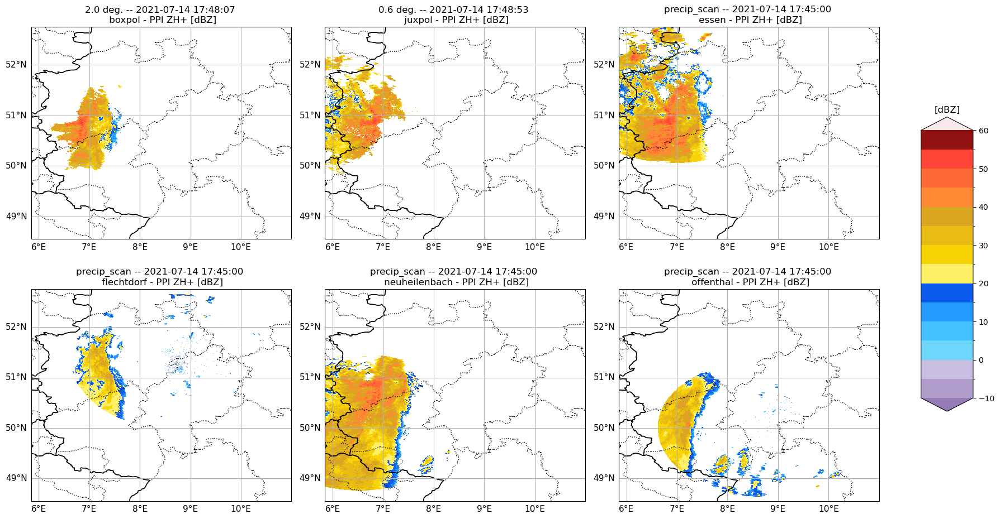

In [33]:
v2p = 'PhiDP [deg]'
v2p = 'rhoHV [-]'
v2p = 'ZDR [dB]'
v2p = 'KDP+ [deg/km]'
v2p = 'AH [dB/km]'
v2p = 'ZH+ [dBZ]'

tp.datavis.rad_display.plot_mgrid(
        [i.georef for k, i in rdata.items()], [i.params for k, i in rdata.items()],
        [i.vars for k, i in rd_qcatc.items()], var2plot=v2p, proj_suffix='utm',
        cpy_feats={'status': True},  data_proj=ccrs.UTM(zone=32),
        xlims=xlims, ylims=ylims, fig_size=(18, 10))

[None]

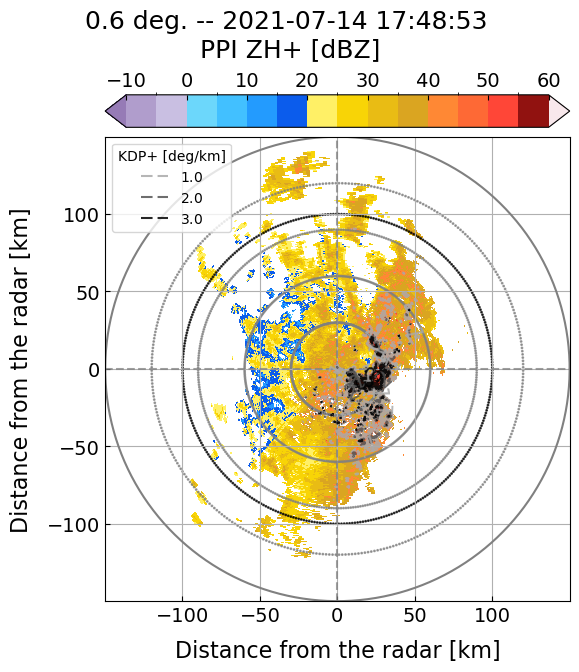

In [34]:
 [tp.datavis.rad_display.plot_ppi(
        rdata[k1].georef, rdata[k1].params, robj.vars, var2plot='ZH+ [dBZ]',
        rd_maxrange=True, ring=100, range_rings=np.arange(30, 150, 30),
        plot_contourl='KDP+ [deg/km]',
        vars_bounds={'KDP+ [deg/km]': [1, 3, 3]},
        contour_kw={'alpha': 0.85, 'linestyles': 'dashed', 'legend': True,
                    'cmap': 'binary'}, font_sizes='large')
     for k1, robj in rd_qcatc.items() if k1 == 'Juxpol']

In this particular instance, I am showcasing the rainfall retrieval data represented by $R(Z_H[opt])$. This method allows for a clear visualisation of rainfall patterns and intensities in relation to the location of the radars.

©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain
©Natural Earth; license: public domain


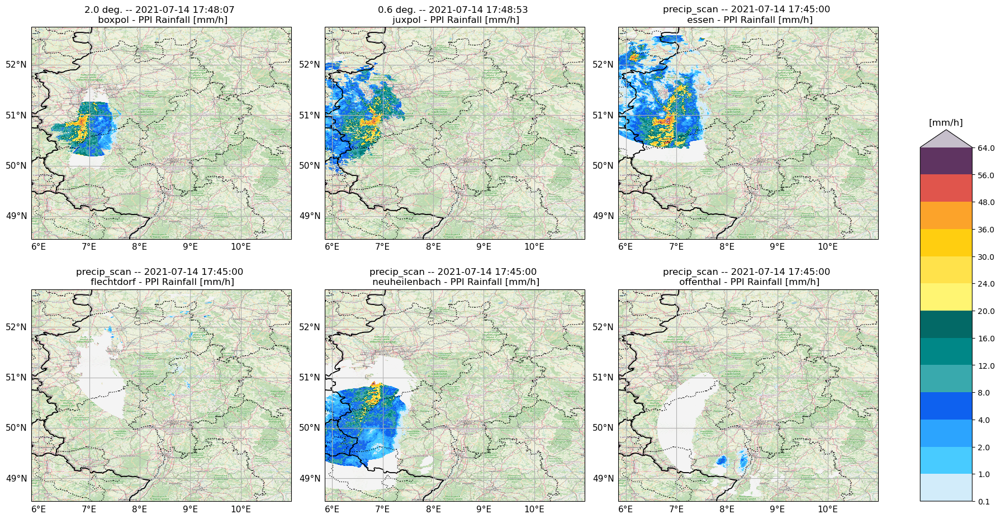

In [35]:
ralg = 'r_zopt'

tp.datavis.rad_display.plot_mgrid(
    [i.georef for k, i in rdata.items()], [i.params for k, i in rdata.items()],
    [getattr(i, ralg) for k, i in rqpe.items()], xlims=xlims, ylims=ylims,
    cpy_feats={'status': True, 'tiles': True, 'alpha_rad': 0.9,
               'alpha_tiles': 1, 'tiles_source': 'OSM', 'tiles_style': None},
    proj_suffix='utm', data_proj=ccrs.UTM(zone=32),
    fig_size=(18, 10))

## Radar composite

### Adds altitude to BH for visualisation

In [36]:
for k1, robj in rd_qcatc.items():
    print(f"Altitude {robj.site_name}: {robj.params['altitude [m]']:0.2f} m")
    # robj.georef['beam_height [km]'] += robj.params['altitude [m]']/1000
    # robj.georef['beamtop_height [km]'] += robj.params['altitude [m]']/1000
    # robj.georef['beambottom_height [km]'] += robj.params['altitude [m]']/1000

# v2p = 'beam_height [km]'

# tp.datavis.rad_display.plot_mgrid(
#     [i.georef for k, i in rd_qcatc.items()],
#     [i.params for k, i in rd_qcatc.items()],
#     [i.georef for k, i in rd_qcatc.items()], var2plot='beam_height [km]',
#     xlims=xlims, ylims=ylims, proj_suffix='utm', data_proj=ccrs.UTM(zone=32),
#     cpy_feats={'status': True, 'tiles': True, 'tiles_source': 'OSM',
#                'alpha_tiles': 1, 'alpha_rad': 0.9,  'tiles_style': None},
#     vars_bounds={'Beam_height [km]': [0, 5, int(1+((5-0)/0.2))]})

if PLOT_METHODS:
    [tp.datavis.rad_display.plot_ppi(
        robj.georef, robj.params, robj.georef, var2plot='beam_height [km]',
        cpy_feats={'status': True, 'tiles': False, 'alpha_rad': 0.9,
                   'alpha_tiles': 1, 'tiles_source': 'OSM',
                   'tiles_style': None}, data_proj=ccrs.PlateCarree(),
        proj_suffix='wgs84', fig_size=fig_size, xlims=xlims, ylims=ylims,
        vars_bounds={'Beam_height [km]': [0, 5, int(1+((5-0)/0.2))]})
     for k1, robj in rd_qcatc.items()]


Altitude Boxpol: 99.50 m
Altitude Juxpol: 310.00 m
Altitude Essen: 185.11 m
Altitude Flechtdorf: 627.88 m
Altitude Neuheilenbach: 585.85 m
Altitude Offenthal: 245.80 m


### Generation of the radar composite using wradlib

I follow the composition recipe decribed [here](https://docs.wradlib.org/en/2.2.0/notebooks/workflow/recipe1.html).
Wradlib composition is based on a weighted combination, using the sampling volume as a quality criterion.

In [37]:
nbins = max([robj.params['ngates'] for k1, robj in rd_qcatc.items()])
nbins = 500

if COMPOSITE:
    tic = perf_counter()
    for k1, robj in rqpe.items():
        [setattr(robj, rp, {(k2): (
            np.where(getattr(robj, rp)['Rainfall [mm/h]'] == 0, np.nan,
                     getattr(robj, rp)['Rainfall [mm/h]'])
            if 'Rainfall' in k2 else v1)
            for k2, v1 in getattr(robj, rp).items()})
            for rp in robj.__dict__.keys() if rp.startswith('r_')]
    # derive UTM Zone 29 coordinates of range-bin centroids
    # create osr projection using epsg number for UTM Zone 29
    rads_coord = {k1: np.array([robj.georef['grid_utmx'].flatten(),
                  robj.georef['grid_utmy'].flatten()]).T
                  for k1, robj in rd_qcatc.items()}
    # define target grid for composition
    xmin, xmax, ymin, ymax = tpx.bbox(
        np.concatenate([i for k, i in rads_coord.items()], axis=0))
    cgrid_x = np.linspace(xmin - nbins, xmax + nbins, int(nbins*2))
    cgrid_y = np.linspace(ymin - nbins, ymax + nbins, int(nbins*2))
    grid_coords = wrl.util.gridaspoints(cgrid_y, cgrid_x)
    # derive quality information - in this case, the pulse volume
    pulse_volumes = {k1: np.tile(wrl.qual.pulse_volume(
        robj.georef['range [m]'], robj.params['gateres [m]'],
        robj.params['beamwidth [deg]']), robj.params['nrays'])
        for k1, robj in rd_qcatc.items()}
    pulse_volumes2 = {
        k1: {'pulse_volume [exp]':
             pulse_volumes[k1].reshape(
                 rd_qcatc[k1].georef['beam_height [km]'].shape)}
        for k1, robj in pulse_volumes.items()}
    # interpolate polar radar-data and quality data to the grid
    rd_quality_gridded = [wrl.comp.togrid(
        robj, grid_coords, rd_qcatc[k1].georef['range [m]'].max()
        + rd_qcatc[k1].georef['range [m]'][0], robj.mean(axis=0),
        pulse_volumes[k1], wrl.ipol.Nearest)
        for k1, robj in rads_coord.items()]
    # Define the radar rainfall products to be composed.
    rfields = {k1: {k: v for k, v in robj.__dict__.items()
                    if isinstance(v, dict)} for k1, robj in rqpe.items()}
    rd_gridded = {k1: [wrl.comp.togrid(
        robj, grid_coords, rd_qcatc[k2].georef['range [m]'].max()
        + rd_qcatc[k2].georef['range [m]'][0], robj.mean(axis=0),
        rfields[k2][k1]['Rainfall [mm/h]'][:, 0:].ravel(), wrl.ipol.Nearest)
        for k2, robj in rads_coord.items()] for k1 in rprods}
    # compose the both radar-data based on the quality information
    # calculated above
    ires = 0.001
    rcomps = {k1: wrl.comp.compose_weighted(
        v1, [1. / (i + ires) for i in rd_quality_gridded])
        for k1, v1 in rd_gridded.items()}
    rcomps = {k1: np.ma.masked_invalid(v1) for k1, v1 in rcomps.items()}
    rcomps = {k1: v1.reshape((len(cgrid_x), len(cgrid_y)))
              for k1, v1 in rcomps.items()}
    # TODO: add option to compose polarimetric moments, BH and MLH.
    rcomp_params = copy.copy(rd_qcatc[list(rd_qcatc)[0]].params)
    dt_mean1 = [robj.scandatetime for k1, robj in rqpe.items()]
    dt_mean = min(dt_mean1)+(max(dt_mean1)-min(dt_mean1))/2
    rcomps['datetime'] = dt_mean
    rcomps['elev_ang [deg]'] = {robj.site_name: robj.elev_angle
                                for k1, robj in rqpe.items()}
    rcomp_georef = {'grid_utmx': grid_coords[:, 0].reshape((len(cgrid_x),
                                                            len(cgrid_y))),
                    'grid_utmy': grid_coords[:, 1].reshape((len(cgrid_x),
                                                            len(cgrid_y)))}
    epsg_to_osr = 32632
    wgs84 = wrl.georef.get_default_projection()
    utm = wrl.georef.epsg_to_osr(epsg_to_osr)
    rcomp_georef['grid_wgs84x'], rcomp_georef['grid_wgs84y'] = (
        wrl.georef.reproject(rcomp_georef['grid_utmx'],
                             rcomp_georef['grid_utmy'], src_crs=utm,
                             trg_crs=wgs84))
    toc2 = perf_counter()
    print(f'TIME ELAPSED [Composite]: {dt.timedelta(seconds=toc2-tic)}')

TIME ELAPSED [Composite]: 0:00:27.313968


Finally, I plot the radar composite of the $R(Z_H)[opt]$ retrieval.

©Natural Earth; license: public domain


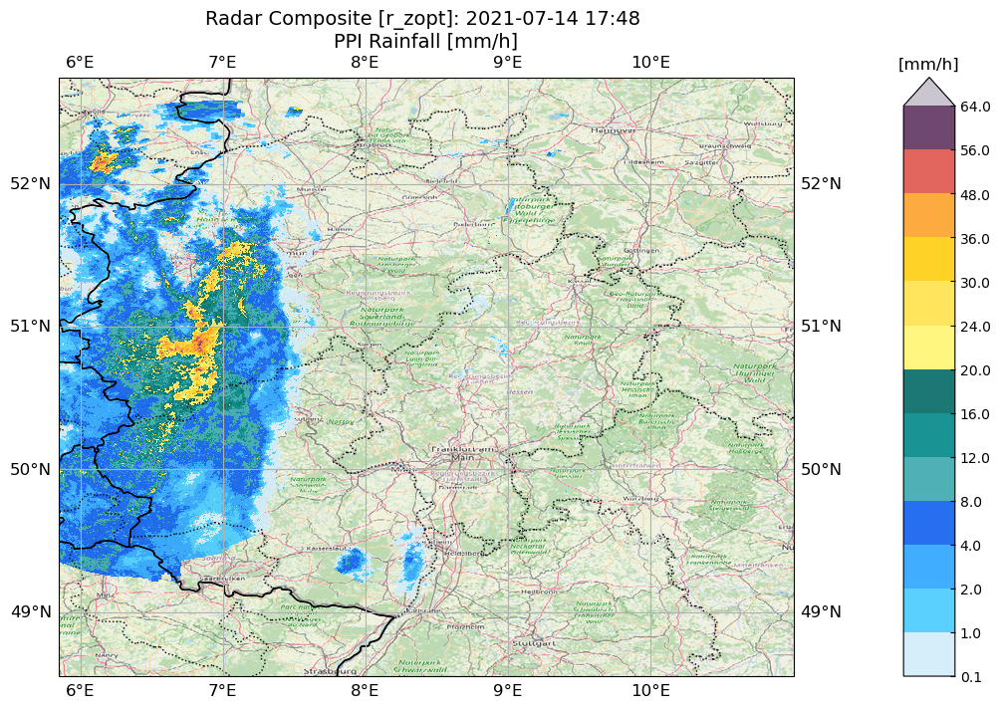

In [38]:
if COMPOSITE:
    ralg = 'r_zopt'
    rcomp_vars = {'Rainfall [mm/h]': rcomps[ralg]}
    rad_display.plot_ppi(
        rcomp_georef, rcomp_params, rcomp_vars, var2plot='Rainfall [mm/h]',
        cpy_feats={'status': True, 'tiles': True, 'alpha_rad': 0.9,
                   'alpha_tiles': 1, 'tiles_source': 'OSM',
                   'tiles_style': None},
        proj_suffix='wgs84', data_proj=ccrs.PlateCarree(),
        xlims=xlims, ylims=ylims, fig_size=fig_size,
        fig_title=(f'Radar Composite [{ralg}]: '
                   + f"{rcomp_params['datetime']:%Y-%m-%d %H:%M}"))

## References

- Bringi, V. N., Keenan, T. D., & Chandrasekar, V. (2001). Correcting C-band radar reflectivity and differential reflectivity data for rain attenuation: A self-consistent method with constraints. IEEE Transactions on Geoscience and Remote Sensing, 39(9), 1906–1915. https://doi.org/10.1109/36.951081
- Chen, J.-Y., Trömel, S., Ryzhkov, A., & Simmer, C. (2021). Assessing the benefits of specific attenuation for quantitative precipitation estimation with a C-band radar network. Journal of Hydrometeorology. https://doi.org/10.1175/JHM-D-20-0299.1
- Diederich, M., Ryzhkov, A., Simmer, C., Zhang, P., & Trömel, S. (2015). Use of Specific Attenuation for Rainfall Measurement at X-Band Radar Wavelengths. Part I: Radar Calibration and Partial Beam Blockage Estimation. Journal of Hydrometeorology, 16(2), 487–502. https://doi.org/10.1175/JHM-D-14-0066.1
- Heistermann, M., Jacobi, S., and Pfaff, T.: Technical Note: An open source library for processing weather radar data (wradlib), Hydrol. Earth Syst. Sci., 17, 863-871, doi:10.5194/hess-17-863-2013, 2013
- Park, S. G., Bringi, V. N., Chandrasekar, V., Maki, M., & Iwanami, K. (2005). Correction of radar reflectivity and differential reflectivity for rain attenuation at X band. Part I: Theoretical and empirical basis. Journal of Atmospheric and Oceanic Technology, 22(11), 1621–1632. https://doi.org/10.1175/JTECH1803.1
- Rico-Ramirez, M. A., & Cluckie, I. D. (2008). Classification of ground clutter and anomalous propagation using dual-polarization weather radar. IEEE Transactions on Geoscience and Remote Sensing, 46(7), 1892–1904. https://doi.org/10.1109/TGRS.2008.916979
- Rico-Ramirez, M. A. (2012). Adaptive attenuation correction techniques for C-band polarimetric weather radars. IEEE Transactions on Geoscience and Remote Sensing, 50(12), 5061–5071. https://doi.org/10.1109/TGRS.2012.2195228
- Ryzhkov, A. V., & Zrnic, D. S. (2019). Radar Polarimetry for Weather Observations. Springer International Publishing. https://doi.org/10.1007/978-3-030-05093-1
- Sanchez-Rivas, D., & Rico-Ramirez, M. A. (2021). Detection of the melting level with polarimetric weather radar. Atmospheric Measurement Techniques, 14(4), 2873–2890. https://doi.org/10.5194/amt-14-2873-2021
- Sanchez-Rivas, D., & Rico-Ramirez, M. A. (2022). Calibration of radar differential reflectivity using quasi-vertical profiles. Atmospheric Measurement Techniques, 15(2), 503–520. https://doi.org/10.5194/amt-15-503-2022
- Sanchez-Rivas, D., & Rico-Ramirez, M. A. (2023). Towerpy: An open-source toolbox for processing polarimetric weather radar data. Environmental Modelling & Software, 167, 105746. https://doi.org/10.1016/j.envsoft.2023.105746
- Trömel, S., Ziegert, M., Ryzhkov, A. V., Chwala, C., & Simmer, C. (2014). Using Microwave Backhaul Links to Optimize the Performance of Algorithms for Rainfall Estimation and Attenuation Correction. Journal of Atmospheric and Oceanic Technology, 31(8), 1748–1760. https://doi.org/10.1175/JTECH-D-14-00016.1
- Vulpiani, G., Montopoli, M., Passeri, L. D., Gioia, A. G., Giordano, P., & Marzano, F. S. (2012). On the Use of Dual-Polarized C-Band Radar for Operational Rainfall Retrieval in Mountainous Areas. Journal of Applied Meteorology and Climatology, 51(2), 405–425. https://doi.org/10.1175/JAMC-D-10-05024.1